# MICRO CREDIT DEFAULTER PROJECT

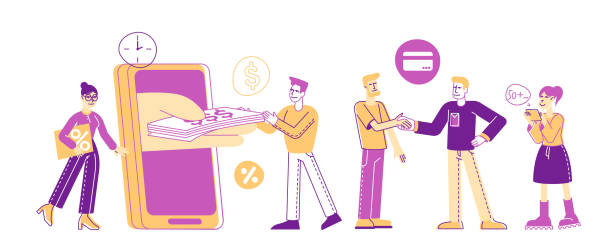

<b>Let's build a model which can be used to predict in terms of a probability for each loan transaction, whether the customer will be paying back the loaned amount within 5 days of insurance of loan. In this case, Label ‘1’ indicates that the loan has been payed i.e. Non- defaulter, while, Label ‘0’ indicates that the loan has not been payed i.e. defaulter.</b> 

# Features Information

<b>label :</b> Flag indicating whether the user paid back the credit amount within 5 days of issuing the loan{1:success, 0:failure}           
<b>msisdn :</b> mobile number of user                 
<b>aon :</b> age on cellular network in days             
<b>daily_decr30 :</b> Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah)   
<b>daily_decr90 :</b> Daily amount spent from main account, averaged over last 90 days (in Indonesian Rupiah)  
<b>rental30 :</b> Average main account balance over last 30 days   
<b>rental90 :</b> Average main account balance over last 90 days     
<b>last_rech_date_ma :</b> Number of days till last recharge of main account      
<b>last_rech_date_da:</b> Number of days till last recharge of data account       
<b>last_rech_amt_ma :</b> Amount of last recharge of main account (in Indonesian Rupiah)       
<b>cnt_ma_rech30 :</b> Number of times main account got recharged in last 30 days      
<b>fr_ma_rech30 :</b> Frequency of main account recharged in last 30 days         
<b>sumamnt_ma_rech30 :</b> Total amount of recharge in main account over last 30 days (in Indonesian Rupiah)      
<b>medianamnt_ma_rech30 :</b> Median of amount of recharges done in main account over last 30 days at user level (in Indonesian Rupiah)        
<b>medianmarechprebal30 :</b> Median of main account balance just before recharge in last 30 days at user level (in Indonesian Rupiah)      
<b>cnt_ma_rech90 :</b> Number of times main account got recharged in last 90 days     
<b>fr_ma_rech90 :</b> Frequency of main account recharged in last 90 days     
<b>sumamnt_ma_rech90 :</b> Total amount of recharge in main account over last 90 days (in Indonasian Rupiah)       
<b>medianamnt_ma_rech90 :</b> Median of amount of recharges done in main account over last 90 days at user level (in Indonasian Rupiah)        
<b>medianmarechprebal90 :</b> Median of main account balance just before recharge in last 90 days at user level (in Indonasian Rupiah)        
<b>cnt_da_rech30 :</b> Number of times data account got recharged in last 30 days       
<b>fr_da_rech30:</b> Frequency of data account recharged in last 30 days       
<b>cnt_da_rech90 :</b> Number of times data account got recharged in last 90 days       
<b>fr_da_rech90 :</b> Frequency of data account recharged in last 90 days       
<b>cnt_loans30 :</b> Number of loans taken by user in last 30 days     
<b>amnt_loans30 :</b> Total amount of loans taken by user in last 30 days        
<b>maxamnt_loans30 :</b> maximum amount of loan taken by the user in last 30 days       
<b>medianamnt_loans30 :</b> Median of amounts of loan taken by the user in last 30 days     
<b>cnt_loans90 :</b> Number of loans taken by user in last 90 days        
<b>amnt_loans90 :</b> Total amount of loans taken by user in last 90 days        
<b>maxamnt_loans90 :</b> maximum amount of loan taken by the user in last 90 days     
<b>medianamnt_loans90 :</b> Median of amounts of loan taken by the user in last 90 days     
<b>payback30 :</b> Average payback time in days over last 30 days       
<b>payback90 :</b> Average payback time in days over last 90 days      
<b>pcircle :</b> telecom circle        
<b>pdate :</b> date

# Importing necessary libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

pd.pandas.set_option('display.max_columns',None)

import warnings
warnings.filterwarnings('ignore')

# Importing the dataset

In [2]:
# As the dataset is very large, let's divide the dataset into chunks

ChunkSize = 10
for chunk in pd.read_csv('Data file.csv', chunksize=ChunkSize):
    print(chunk.shape)
    print("*"*80)
    print(chunk.head(2))
    print("*"*80)
    break

(10, 37)
********************************************************************************
   Unnamed: 0  label       msisdn  aon  daily_decr30  daily_decr90  rental30  \
0           1      0  21408I70789  272       3055.05       3065.15    220.13   
1           2      1  76462I70374  712      12122.00      12124.75   3691.26   

   rental90  last_rech_date_ma  last_rech_date_da  last_rech_amt_ma  \
0    260.13                  2                  0              1539   
1   3691.26                 20                  0              5787   

   cnt_ma_rech30  fr_ma_rech30  sumamnt_ma_rech30  medianamnt_ma_rech30  \
0              2            21               3078                  1539   
1              1             0               5787                  5787   

   medianmarechprebal30  cnt_ma_rech90  fr_ma_rech90  sumamnt_ma_rech90  \
0                  7.50              2            21               3078   
1                 61.04              1             0               5787   

   

In [3]:
MyList = []
ChunkSize = 10
for chunk in pd.read_csv('Data file.csv', chunksize=ChunkSize):
    MyList.append(chunk)

In [4]:
len(MyList)

20960

In [5]:
df = pd.read_csv('Data file.csv')
df.shape

(209593, 37)

In [6]:
# Let us see one of the chunk

MyList[0]

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272,3055.050000,3065.150000,220.13,260.13,2,0,1539,2,21,3078,1539,7.50,2,21,3078,1539,7.50,0,0,0,0,2,12,6,0,2,12,6,0,29.000000,29.000000,UPW,2016-07-20
1,2,1,76462I70374,712,12122.000000,12124.750000,3691.26,3691.26,20,0,5787,1,0,5787,5787,61.04,1,0,5787,5787,61.04,0,0,0,0,1,12,12,0,1,12,12,0,0.000000,0.000000,UPW,2016-08-10
2,3,1,17943I70372,535,1398.000000,1398.000000,900.13,900.13,3,0,1539,1,0,1539,1539,66.32,1,0,1539,1539,66.32,0,0,0,0,1,6,6,0,1,6,6,0,0.000000,0.000000,UPW,2016-08-19
3,4,1,55773I70781,241,21.228000,21.228000,159.42,159.42,41,0,947,0,0,0,0,0.00,1,0,947,947,2.50,0,0,0,0,2,12,6,0,2,12,6,0,0.000000,0.000000,UPW,2016-06-06
4,5,1,03813I82730,947,150.619333,150.619333,1098.90,1098.90,4,0,2309,7,2,20029,2309,29.00,8,2,23496,2888,35.00,0,0,0,0,7,42,6,0,7,42,6,0,2.333333,2.333333,UPW,2016-06-22
5,6,1,35819I70783,568,2257.362667,2261.460000,368.13,380.13,2,0,1539,4,10,6156,1539,15.40,8,0,11744,1539,55.90,0,0,0,0,3,18,6,0,3,18,6,0,11.000000,8.333333,UPW,2016-07-02
6,7,1,96759I84459,545,2876.641667,2883.970000,335.75,402.90,13,0,5787,1,0,5787,5787,277.80,1,0,5787,5787,277.80,0,0,0,0,1,6,6,0,1,6,6,0,0.000000,0.000000,UPW,2016-07-05
7,8,1,09832I90846,768,12905.000000,17804.150000,900.35,2549.11,4,55,3178,3,3,10404,3178,36.00,9,3,26095,3178,36.00,0,0,1,0,3,18,6,0,7,42,6,0,6.000000,3.857143,UPW,2016-08-05
8,9,1,59772I84450,1191,90.695000,90.695000,2287.50,2287.50,1,0,1539,4,1,6164,1539,39.90,4,1,6164,1539,39.90,0,0,0,0,4,24,6,0,4,24,6,0,2.666667,2.666667,UPW,2016-06-15
9,10,1,56331I70783,536,29.357333,29.357333,612.96,612.96,11,0,773,1,0,773,773,86.80,1,0,773,773,86.80,0,0,0,0,1,6,6,0,1,6,6,0,0.000000,0.000000,UPW,2016-06-08


In [7]:
# Combining the chunks

df1 = pd.concat(MyList, axis=0)

In [8]:
df1.shape

(209593, 37)

In [9]:
df1.head()

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,2016-07-20
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,2016-08-10
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-08-19
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,2016-06-06
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,2016-06-22


In [10]:
df1.columns

Index(['Unnamed: 0', 'label', 'msisdn', 'aon', 'daily_decr30', 'daily_decr90',
       'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_date_da',
       'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30',
       'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30',
       'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90',
       'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_da_rech30',
       'fr_da_rech30', 'cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30',
       'amnt_loans30', 'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90',
       'amnt_loans90', 'maxamnt_loans90', 'medianamnt_loans90', 'payback30',
       'payback90', 'pcircle', 'pdate'],
      dtype='object')

In [11]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 37 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0            209593 non-null  int64  
 1   label                 209593 non-null  int64  
 2   msisdn                209593 non-null  object 
 3   aon                   209593 non-null  float64
 4   daily_decr30          209593 non-null  float64
 5   daily_decr90          209593 non-null  float64
 6   rental30              209593 non-null  float64
 7   rental90              209593 non-null  float64
 8   last_rech_date_ma     209593 non-null  float64
 9   last_rech_date_da     209593 non-null  float64
 10  last_rech_amt_ma      209593 non-null  int64  
 11  cnt_ma_rech30         209593 non-null  int64  
 12  fr_ma_rech30          209593 non-null  float64
 13  sumamnt_ma_rech30     209593 non-null  float64
 14  medianamnt_ma_rech30  209593 non-null  float64
 15  

# Checking for null values

In [12]:
df1.isnull().values.any()

False

In [13]:
df1.isnull().sum()

Unnamed: 0              0
label                   0
msisdn                  0
aon                     0
daily_decr30            0
daily_decr90            0
rental30                0
rental90                0
last_rech_date_ma       0
last_rech_date_da       0
last_rech_amt_ma        0
cnt_ma_rech30           0
fr_ma_rech30            0
sumamnt_ma_rech30       0
medianamnt_ma_rech30    0
medianmarechprebal30    0
cnt_ma_rech90           0
fr_ma_rech90            0
sumamnt_ma_rech90       0
medianamnt_ma_rech90    0
medianmarechprebal90    0
cnt_da_rech30           0
fr_da_rech30            0
cnt_da_rech90           0
fr_da_rech90            0
cnt_loans30             0
amnt_loans30            0
maxamnt_loans30         0
medianamnt_loans30      0
cnt_loans90             0
amnt_loans90            0
maxamnt_loans90         0
medianamnt_loans90      0
payback30               0
payback90               0
pcircle                 0
pdate                   0
dtype: int64

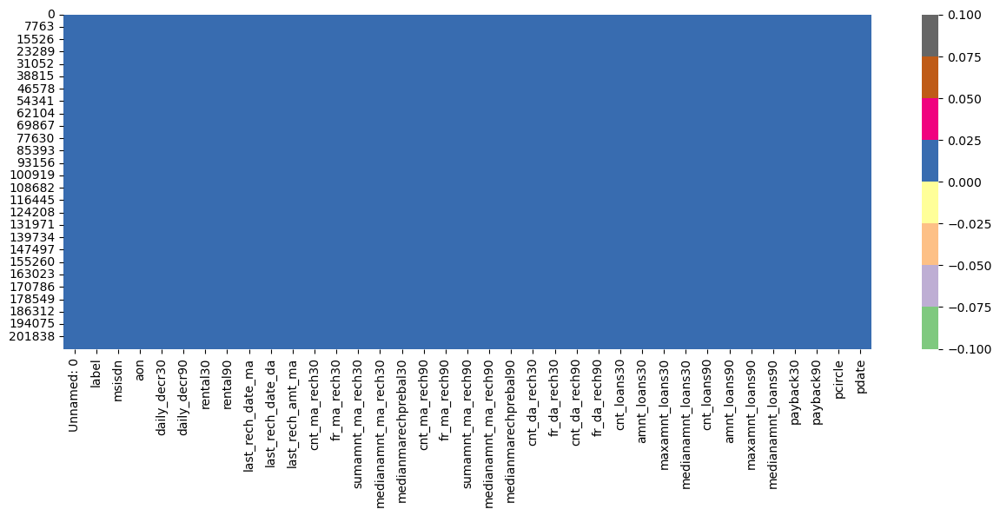

In [14]:
# Let's visualize the null values clearly using heat map

plt.figure(figsize=(15,5))
sns.heatmap(df1.isnull(), cmap="Accent")
plt.show()

<b>As we can see, there are no null values present in the dataset.</b>

In [15]:
#lets check for duplicate values if there are any

df1.duplicated().sum()

0

In [16]:
# Checking number of unique values in each column of dataset

df1.nunique().to_frame("No of Unique Values")

,No of Unique Values
Unnamed: 0,209593
label,2
msisdn,186243
aon,4507
daily_decr30,147025
daily_decr90,158669
rental30,132148
rental90,141033
last_rech_date_ma,1186
last_rech_date_da,1174


# Dropping irrelevant columns

<b>As the column 'pcircle' consists of a single unique value and the column 'Unnamed: 0' consists of only unique values, let's drop these columns. Also, the column 'msisdn' consists of mobile number of the users, which is of no use in our predicion. So, let's drop this column as well.</b>

In [17]:
df1.drop(columns = ['pcircle', 'Unnamed: 0', 'msisdn'], inplace = True )

# Dealing with zero values

In [18]:
Zero_value = pd.DataFrame(df1.isin([0]).sum().sort_values(ascending=False))
Zero_value.columns = ['Count of Zero values']
Zero_value['% of Zero values'] = Zero_value['Count of Zero values']/2095.93    # 209593/100 = 2095.93
Zero_value

,Count of Zero values,% of Zero values
fr_da_rech90,208728,99.587295
fr_da_rech30,208014,99.246635
cnt_da_rech30,205479,98.037148
cnt_da_rech90,204226,97.439323
last_rech_date_da,202861,96.788061
medianamnt_loans90,197424,94.193985
medianamnt_loans30,195445,93.249775
payback30,106712,50.913914
payback90,95699,45.659445
fr_ma_rech30,78683,37.540853


In [19]:
# Dropping columns having more than 90% of zero values

df1.drop(columns=['fr_da_rech90', 'fr_da_rech30', 'cnt_da_rech30', 'cnt_da_rech90', 'last_rech_date_da', 'medianamnt_loans90', 'medianamnt_loans30'],axis=1,inplace=True)

# Feature Extraction

In [20]:
# Converting pdate column from object type into datetime type

df1.pdate = pd.to_datetime(df1['pdate'])

In [21]:
# Extract day feature from pdate feature
df1['Day'] = df1['pdate'].dt.day

df1[['Day']]

,Day
0,20
1,10
2,19
3,6
4,22
...,...
209588,17
209589,12
209590,29
209591,25


In [22]:
# Extract month from pdate
df1['Month'] = df1['pdate'].dt.month

df1[['Month']]

,Month
0,7
1,8
2,8
3,6
4,6
...,...
209588,6
209589,6
209590,7
209591,7


In [23]:
# Extract Year from pdate
df1['Year'] = df1['pdate'].dt.year

df1[['Year']]

,Year
0,2016
1,2016
2,2016
3,2016
4,2016
...,...
209588,2016
209589,2016
209590,2016
209591,2016


In [24]:
df1['Year'].nunique()

1

In [25]:
df1['Year'].value_counts()

2016    209593
Name: Year, dtype: int64

In [26]:
# Dropping the column 'Year' as it consists of a single unique value

df1.drop('Year', axis=1, inplace=True)

In [27]:
# Dropping pdate column after separating day, month and year from it

df1.drop('pdate', axis=1, inplace=True)

In [28]:
df1.head()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,Day,Month
0,0,272.0,3055.050000,3065.150000,220.13,260.13,2.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,2,12,6.0,2.0,12,6,29.000000,29.000000,20,7
1,1,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,1,12,12.0,1.0,12,12,0.000000,0.000000,10,8
2,1,535.0,1398.000000,1398.000000,900.13,900.13,3.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,1,6,6.0,1.0,6,6,0.000000,0.000000,19,8
3,1,241.0,21.228000,21.228000,159.42,159.42,41.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,2,12,6.0,2.0,12,6,0.000000,0.000000,6,6
4,1,947.0,150.619333,150.619333,1098.90,1098.90,4.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,7,42,6.0,7.0,42,6,2.333333,2.333333,22,6


In [29]:
# Checking the uniqueness of target column

df1['label'].nunique()

2

In [30]:
df1['label'].value_counts()

1    183431
0     26162
Name: label, dtype: int64

# Description of Dataset

In [31]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
label,209593.0,0.875177,0.330519,0.000000,1.000,1.000000,1.00,1.000000
aon,209593.0,8112.343445,75696.082531,-48.000000,246.000,527.000000,982.00,999860.755168
daily_decr30,209593.0,5381.402289,9220.623400,-93.012667,42.440,1469.175667,7244.00,265926.000000
daily_decr90,209593.0,6082.515068,10918.812767,-93.012667,42.692,1500.000000,7802.79,320630.000000
rental30,209593.0,2692.581910,4308.586781,-23737.140000,280.420,1083.570000,3356.94,198926.110000
rental90,209593.0,3483.406534,5770.461279,-24720.580000,300.260,1334.000000,4201.79,200148.110000
last_rech_date_ma,209593.0,3755.847800,53905.892230,-29.000000,1.000,3.000000,7.00,998650.377733
last_rech_amt_ma,209593.0,2064.452797,2370.786034,0.000000,770.000,1539.000000,2309.00,55000.000000
cnt_ma_rech30,209593.0,3.978057,4.256090,0.000000,1.000,3.000000,5.00,203.000000
fr_ma_rech30,209593.0,3737.355121,53643.625172,0.000000,0.000,2.000000,6.00,999606.368132


In [32]:
# Converting negative values present in the above features into positive values 

df1['aon'] = abs(df1['aon'])
df1['daily_decr30'] = abs(df1['daily_decr30'])
df1['daily_decr90'] = abs(df1['daily_decr90'])
df1['rental30'] = abs(df1['rental30'])
df1['rental90'] = abs(df1['rental90'])
df1['last_rech_date_ma'] = abs(df1['last_rech_date_ma'])
df1['medianmarechprebal30'] = abs(df1['medianmarechprebal30'])
df1['medianmarechprebal90'] = abs(df1['medianmarechprebal90'])

In [33]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
label,209593.0,0.875177,0.330519,0.0,1.000000,1.000000,1.00,1.000000
aon,209593.0,8112.808718,75696.032666,1.0,246.000000,527.000000,982.00,999860.755168
daily_decr30,209593.0,5381.431293,9220.606472,0.0,42.453000,1469.175667,7244.00,265926.000000
daily_decr90,209593.0,6082.544140,10918.796572,0.0,42.693333,1500.000000,7802.79,320630.000000
rental30,209593.0,2715.376558,4294.257439,0.0,299.700000,1095.750000,3362.35,198926.110000
rental90,209593.0,3509.497148,5754.630600,0.0,330.000000,1347.220000,4204.51,200148.110000
last_rech_date_ma,209593.0,3756.125844,53905.872857,0.0,1.000000,3.000000,7.00,998650.377733
last_rech_amt_ma,209593.0,2064.452797,2370.786034,0.0,770.000000,1539.000000,2309.00,55000.000000
cnt_ma_rech30,209593.0,3.978057,4.256090,0.0,1.000000,3.000000,5.00,203.000000
fr_ma_rech30,209593.0,3737.355121,53643.625172,0.0,0.000000,2.000000,6.00,999606.368132


# Data Visualization

# Univariate Analysis

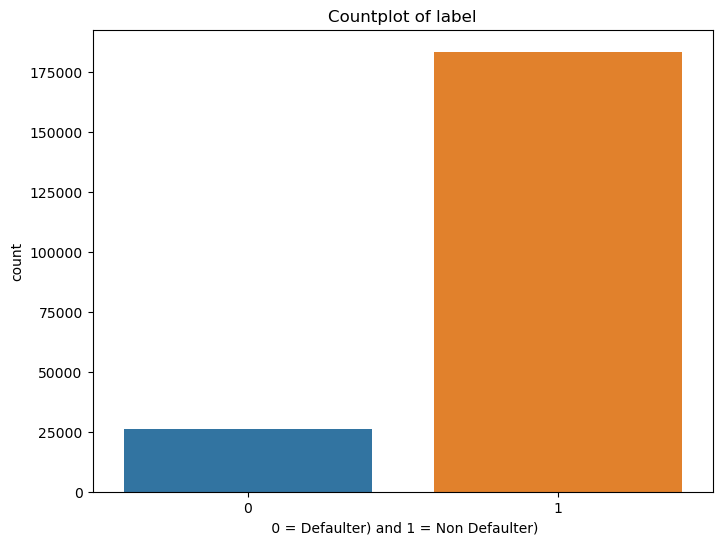

1    183431
0     26162
Name: label, dtype: int64

In [34]:
plt.subplots(figsize=(8,6))
sns.countplot(x='label', data=df1)
plt.title("Countplot of label")
plt.xlabel(' 0 = Defaulter) and 1 = Non Defaulter)')
plt.ylabel('count')
plt.show()

df1['label'].value_counts()

<b>As we can see, majority of the customers are non-defaulters.</b>

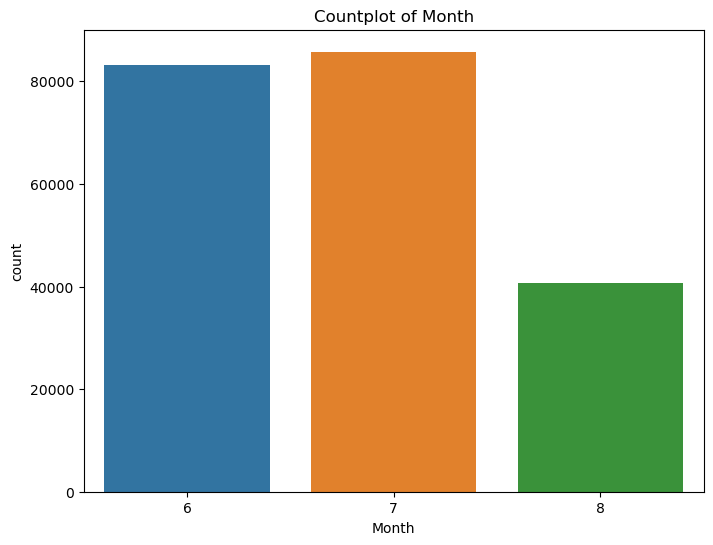

7    85765
6    83154
8    40674
Name: Month, dtype: int64

In [35]:
plt.subplots(figsize=(8,6))
sns.countplot(x='Month', data=df1)
plt.title('Countplot of Month')
plt.xlabel('Month')
plt.ylabel('count')
plt.show()

df1['Month'].value_counts()

<b>As we can see, majority of the customers (85765) have taken credit in the 7th month.</b>

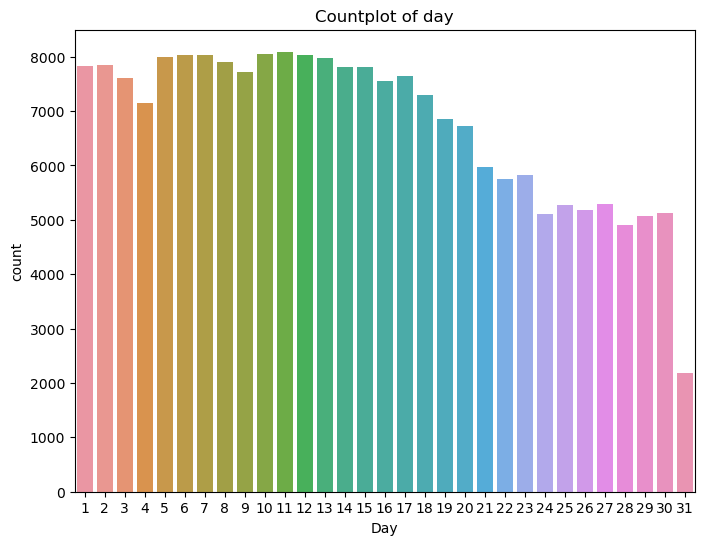

11    8092
10    8050
6     8030
12    8028
7     8026
5     7989
13    7969
8     7899
2     7839
1     7824
15    7820
14    7816
9     7717
17    7643
3     7607
16    7556
18    7305
4     7154
19    6857
20    6729
21    5964
23    5816
22    5753
27    5283
25    5269
26    5174
30    5129
24    5103
29    5077
28    4897
31    2178
Name: Day, dtype: int64

In [36]:
plt.subplots(figsize=(8,6))
sns.countplot(x='Day', data=df1)
plt.title('Countplot of day')
plt.xlabel('Day')
plt.ylabel('count')
plt.show()

df1['Day'].value_counts()

<b>As we can see, majority of the customers (8092) have taken credit on the 11th day of the month.</b>

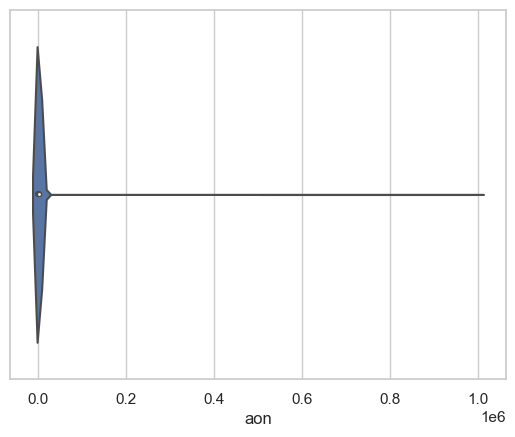

95.000000        392
92.000000        362
96.000000        357
99.000000        356
157.000000       349
                ... 
977092.351997      1
645851.038396      1
881623.815396      1
555267.797667      1
811881.372822      1
Name: aon, Length: 4499, dtype: int64

In [37]:
sns.set(style='whitegrid')
sns.violinplot(df1['aon'])
plt.show()

df1['aon'].value_counts()

<b>As we can see, age on cellular network in days of maximum customers is 95 days.</b>

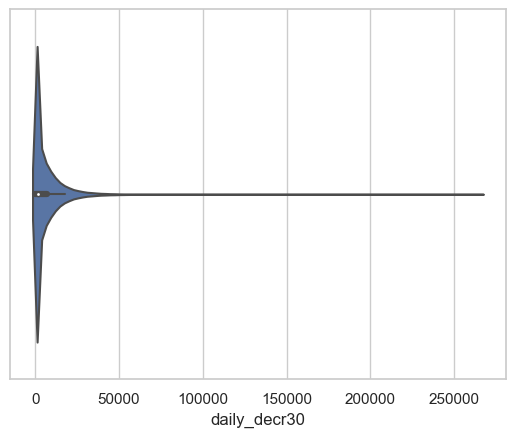

0.000000        4144
500.000000       829
1000.000000      569
700.000000       381
600.000000       354
                ... 
3185.960000        1
2044.981667        1
18117.584000       1
13120.291667       1
4489.362000        1
Name: daily_decr30, Length: 146597, dtype: int64

In [38]:
sns.set(style='whitegrid')
sns.violinplot(df1['daily_decr30'])
plt.show()

df1['daily_decr30'].value_counts()

<b>As we can see, daily amount spent from main account, averaged over last 30 days for majority of the customers is 0.</b>

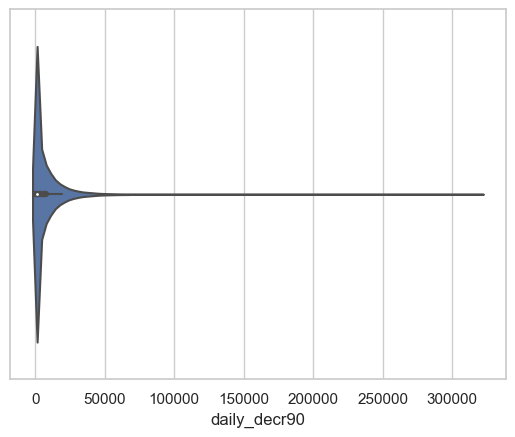

0.000000        4063
500.000000       781
1000.000000      490
700.000000       343
600.000000       316
                ... 
24001.960000       1
12.233333          1
127.591667         1
21.434000          1
4534.820000        1
Name: daily_decr90, Length: 158245, dtype: int64

In [39]:
sns.set(style='whitegrid')
sns.violinplot(df1['daily_decr90'])
plt.show()

df1['daily_decr90'].value_counts()

<b>As we can see, daily amount spent from main account, averaged over last 90 days for majority of the customers is 0.</b>

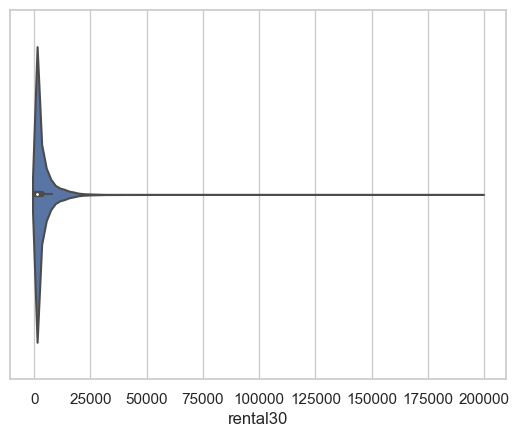

0.00       7566
200.13     1379
99.56      1020
400.26      530
199.12      461
           ... 
4184.14       1
1840.27       1
4272.96       1
3578.21       1
483.92        1
Name: rental30, Length: 129745, dtype: int64

In [40]:
sns.set(style='whitegrid')
sns.violinplot(df1['rental30'])
plt.show()

df1['rental30'].value_counts()

<b>As we can see, average main account balance over last 30 days for majority of the customers is 0.</b>

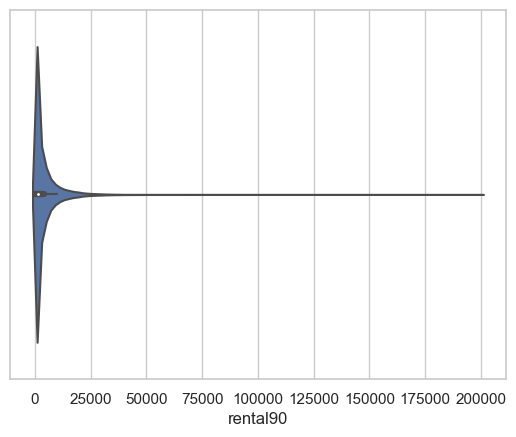

0.00        6918
200.13       913
99.56        767
60.00        692
90.00        685
            ... 
808.81         1
14137.84       1
2825.65        1
628.29         1
984.58         1
Name: rental90, Length: 138712, dtype: int64

In [41]:
sns.set(style='whitegrid')
sns.violinplot(df1['rental90'])
plt.show()

df1['rental90'].value_counts()

<b>As we can see, average main account balance over last 90 days for majority of the customers is 0.</b>

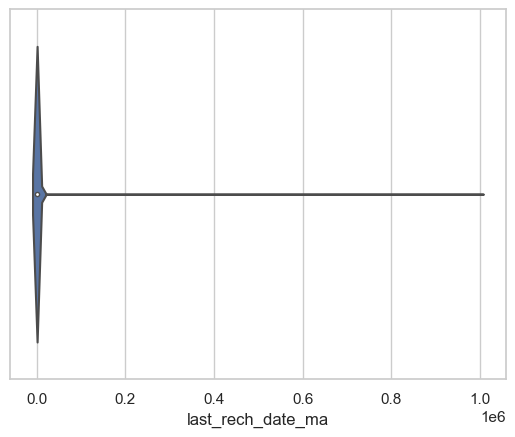

1.000000         47362
2.000000         26677
0.000000         20743
3.000000         19999
4.000000         15470
                 ...  
972385.270172        1
800187.053741        1
851900.041103        1
679670.490441        1
590843.121987        1
Name: last_rech_date_ma, Length: 1157, dtype: int64

In [42]:
sns.set(style='whitegrid')
sns.violinplot(df1['last_rech_date_ma'])
plt.show()

df1['last_rech_date_ma'].value_counts()

<b>As we can see, number of days till last recharge of main account for majority of the customers is 1.</b>

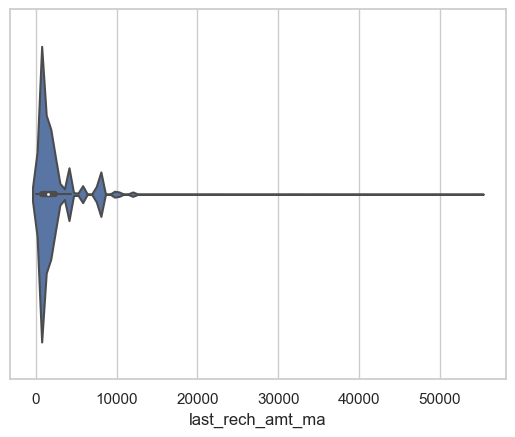

1539     56297
770      41766
0        20995
773      19523
2309     16113
         ...  
4066         1
15652        1
772          1
34783        1
10454        1
Name: last_rech_amt_ma, Length: 70, dtype: int64

In [43]:
sns.set(style='whitegrid')
sns.violinplot(df1['last_rech_amt_ma'])
plt.show()

df1['last_rech_amt_ma'].value_counts()

<b>As we can see, amount of last recharge of main account for majority of the customers is 1539.</b>

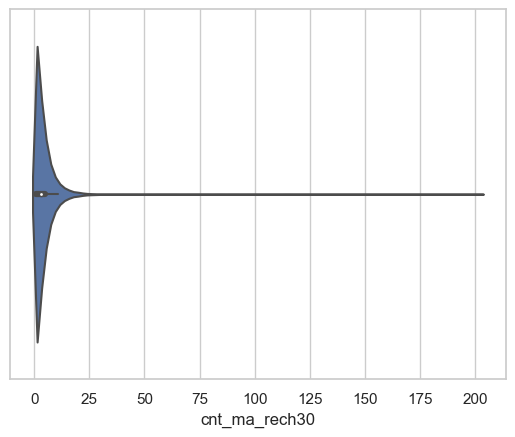

1     37238
2     31216
0     27979
3     25519
4     20258
      ...  
84        1
59        1
64        1
74        1
63        1
Name: cnt_ma_rech30, Length: 71, dtype: int64

In [44]:
sns.set(style='whitegrid')
sns.violinplot(df1['cnt_ma_rech30'])
plt.show()

df1['cnt_ma_rech30'].value_counts()

<b>As we can see, number of times main account got recharged in last 30 days for majority of the customers is 1.</b>

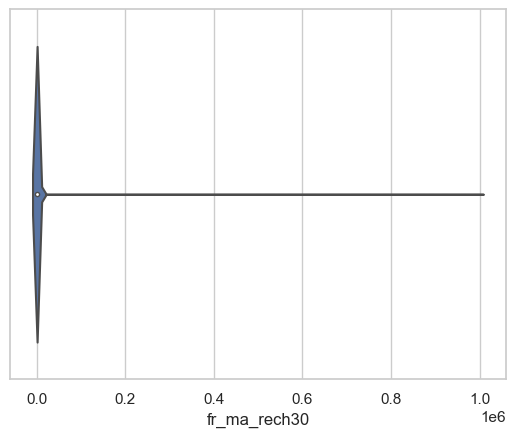

0.000000         78683
1.000000         22370
2.000000         18849
3.000000         14306
4.000000         11194
                 ...  
967338.131624        1
779697.846039        1
723333.519767        1
891246.004030        1
747564.075282        1
Name: fr_ma_rech30, Length: 1083, dtype: int64

In [45]:
sns.set(style='whitegrid')
sns.violinplot(df1['fr_ma_rech30'])
plt.show()

df1['fr_ma_rech30'].value_counts()

<b>As we can see, frequency of main account recharged in last 30 days for majority of the customers is 0.</b>

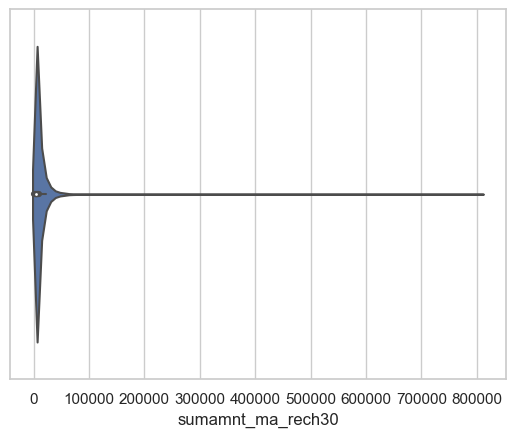

0.0        27979
1539.0      9006
770.0       6040
773.0       4540
2309.0      4509
           ...  
40924.0        1
38412.0        1
22899.0        1
5381.0         1
12154.0        1
Name: sumamnt_ma_rech30, Length: 15141, dtype: int64

In [46]:
sns.set(style='whitegrid')
sns.violinplot(df1['sumamnt_ma_rech30'])
plt.show()

df1['sumamnt_ma_rech30'].value_counts()

<b>As we can see, total amount of recharge in main account over last 30 days for majority of the customers is 0.</b>

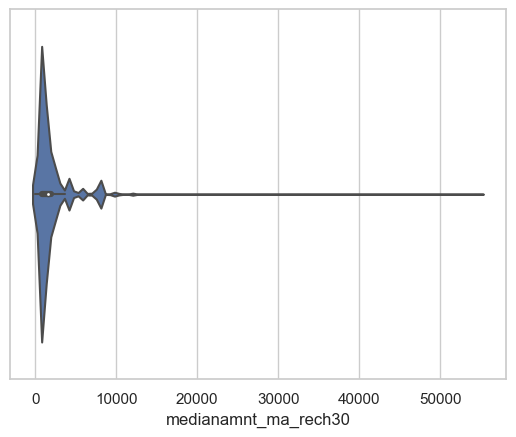

1539.0     47769
770.0      30754
0.0        27979
773.0      22680
2309.0     11177
           ...  
2690.5         1
4729.5         1
4742.0         1
3566.5         1
10963.5        1
Name: medianamnt_ma_rech30, Length: 510, dtype: int64

In [47]:
sns.set(style='whitegrid')
sns.violinplot(df1['medianamnt_ma_rech30'])
plt.show()

df1['medianamnt_ma_rech30'].value_counts()

<b>As we can see, median of amount of recharges done in main account over last 30 days at user level for majority of the customers is 1539.</b>

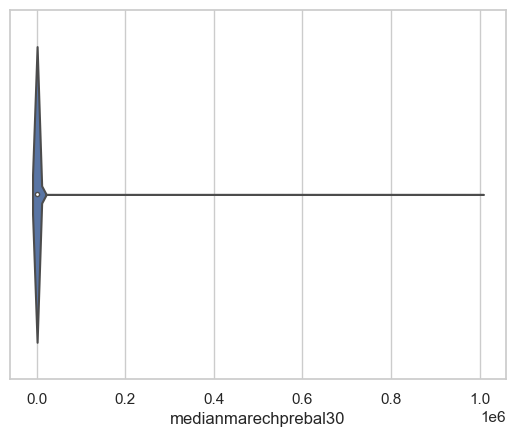

0.000      30680
20.000      1108
19.000      1091
17.000      1061
10.000      1045
           ...  
38.020         1
39.165         1
71.640         1
110.510        1
71.370         1
Name: medianmarechprebal30, Length: 29634, dtype: int64

In [48]:
sns.set(style='whitegrid')
sns.violinplot(df1['medianmarechprebal30'])
plt.show()

df1['medianmarechprebal30'].value_counts()

<b>As we can see, median of main account balance just before recharge in last 30 days at user level for majority of the customers is 0.</b>

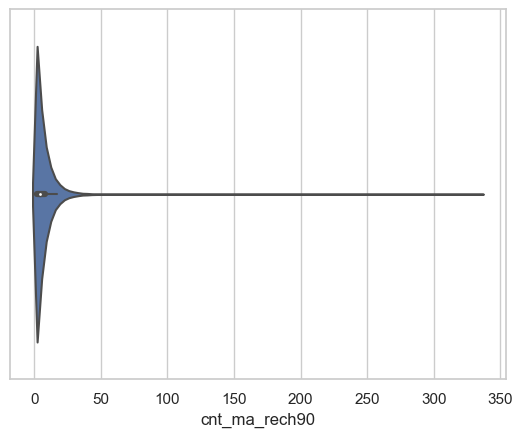

1      27898
2      24052
0      20950
3      20446
4      17329
       ...  
105        1
110        1
140        1
94         1
120        1
Name: cnt_ma_rech90, Length: 110, dtype: int64

In [49]:
sns.set(style='whitegrid')
sns.violinplot(df1['cnt_ma_rech90'])
plt.show()

df1['cnt_ma_rech90'].value_counts()

<b>As we can see, number of times main account got recharged in last 90 days for majority of the customers is 1.</b>

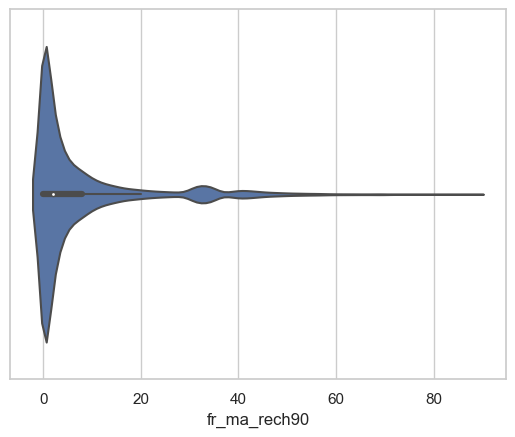

0     65753
1     24373
2     19285
3     13192
4     10021
      ...  
80        7
81        7
88        5
84        4
87        1
Name: fr_ma_rech90, Length: 89, dtype: int64

In [50]:
sns.set(style='whitegrid')
sns.violinplot(df1['fr_ma_rech90'])
plt.show()

df1['fr_ma_rech90'].value_counts()

<b>As we can see, frequency of main account recharged in last 90 days for majority of the customers is 0.</b>

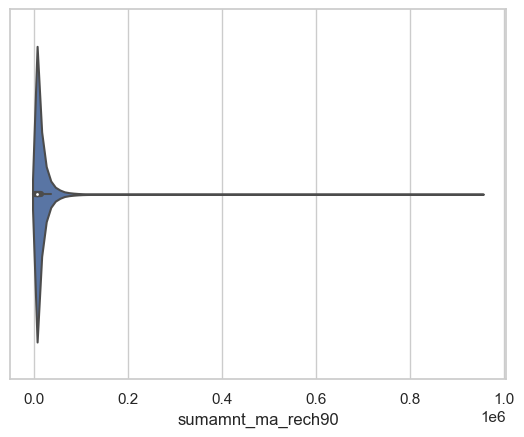

0        20950
1539      5631
773       4177
770       3982
2309      2542
         ...  
32427        1
71229        1
78428        1
8241         1
17941        1
Name: sumamnt_ma_rech90, Length: 31771, dtype: int64

In [51]:
sns.set(style='whitegrid')
sns.violinplot(df1['sumamnt_ma_rech90'])
plt.show()

df1['sumamnt_ma_rech90'].value_counts()

<b>As we can see, total amount of recharge in main account over last 90 days for majority of the customers is 0.</b>

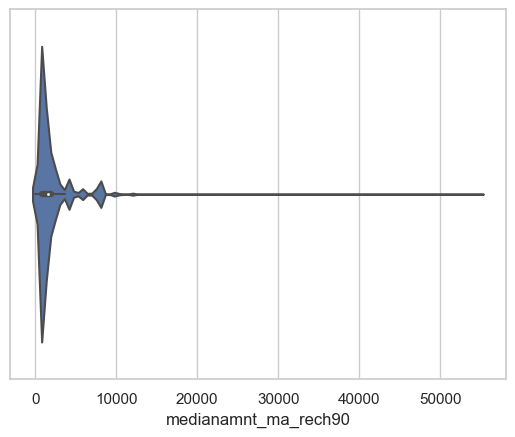

1539.0     45780
773.0      30543
770.0      23844
0.0        20950
2309.0     10665
           ...  
8708.5         1
6350.0         1
4700.0         1
6818.0         1
10963.5        1
Name: medianamnt_ma_rech90, Length: 608, dtype: int64

In [52]:
sns.set(style='whitegrid')
sns.violinplot(df1['medianamnt_ma_rech90'])
plt.show()

df1['medianamnt_ma_rech90'].value_counts()

<b>As we can see, median of amount of recharges done in main account over last 90 days at user level for majority of the customers is 1539.</b>

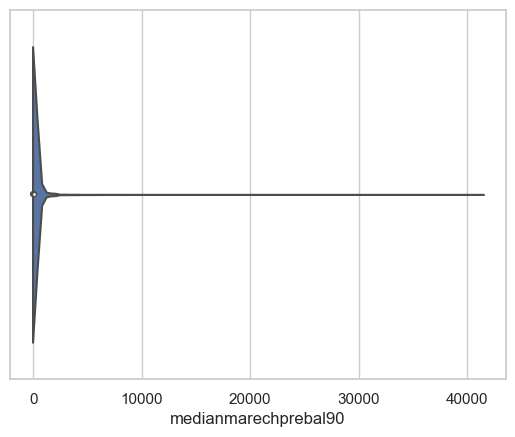

0.00       23391
20.00       1265
19.00       1208
26.00       1171
27.00       1168
           ...  
1121.71        1
48.44          1
161.46         1
53.01          1
392.20         1
Name: medianmarechprebal90, Length: 28957, dtype: int64

In [53]:
sns.set(style='whitegrid')
sns.violinplot(df1['medianmarechprebal90'])
plt.show()

df1['medianmarechprebal90'].value_counts()

<b>As we can see, median of main account balance just before recharge in last 90 days at user level for majority of the customers is 0.</b>

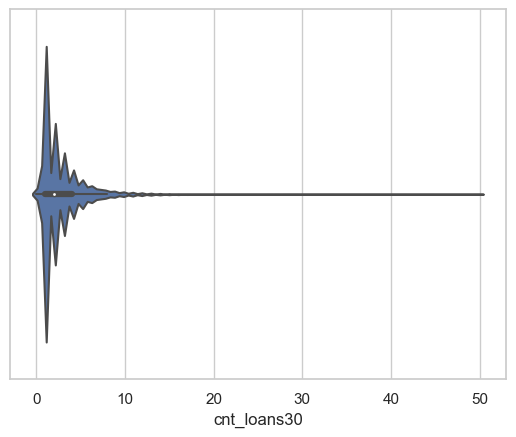

1     83432
2     42665
3     27050
4     17499
5     11673
6      7773
7      5041
8      3384
0      3259
9      2273
10     1571
11     1143
12      793
13      547
14      383
15      270
16      213
17      164
18       98
19       77
20       54
21       45
22       42
23       38
25       19
26       17
27       15
24       13
29        9
31        8
28        7
30        4
32        4
33        3
38        2
36        1
41        1
44        1
50        1
35        1
Name: cnt_loans30, dtype: int64

In [54]:
sns.set(style='whitegrid')
sns.violinplot(df1['cnt_loans30'])
plt.show()

df1['cnt_loans30'].value_counts()

<b>As we can see, number of loans taken by user in last 30 days for majority of the customers is 1.</b>

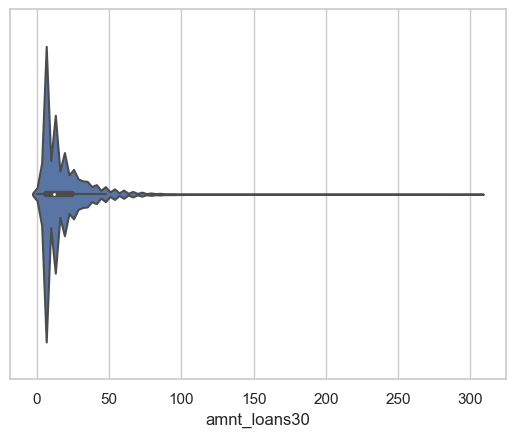

6      76620
12     44384
18     26379
24     18403
30     11999
36      8559
42      5580
48      3994
0       3259
54      2660
60      2043
66      1402
72      1101
78       742
84       580
90       394
96       333
102      252
108      182
114      135
120      119
132       92
126       80
138       64
156       34
150       30
144       30
162       29
168       20
174       17
186       15
180       13
192        7
198        6
252        4
210        4
228        4
216        4
222        3
258        3
264        3
276        3
240        2
204        2
246        1
300        1
270        1
306        1
Name: amnt_loans30, dtype: int64

In [55]:
sns.set(style='whitegrid')
sns.violinplot(df1['amnt_loans30'])
plt.show()

df1['amnt_loans30'].value_counts()

<b>As we can see, total amount of loans taken by user in last 30 days for majority of the customers is 6.</b>

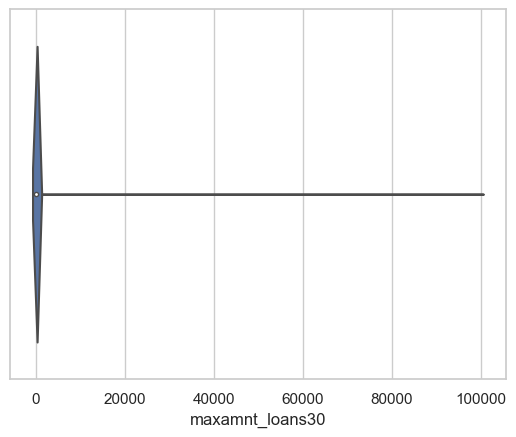

6.000000        179193
12.000000        26109
0.000000          3244
17083.998141         1
62511.750702         1
                 ...  
30346.385852         1
66821.819056         1
55716.817238         1
41580.156627         1
96927.243252         1
Name: maxamnt_loans30, Length: 1050, dtype: int64

In [56]:
sns.set(style='whitegrid')
sns.violinplot(df1['maxamnt_loans30'])
plt.show()

df1['maxamnt_loans30'].value_counts()

<b>As we can see, maximum amount of loan taken by the user in last 30 days for majority of the customers is 6.</b>

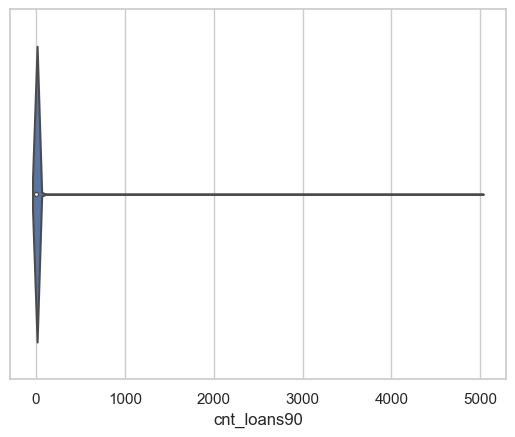

1.000000       73862
2.000000       37286
3.000000       23986
4.000000       16761
5.000000       12331
               ...  
3940.313295        1
2547.650840        1
2925.920310        1
1757.322504        1
2047.902454        1
Name: cnt_loans90, Length: 1110, dtype: int64

In [57]:
sns.set(style='whitegrid')
sns.violinplot(df1['cnt_loans90'])
plt.show()

df1['cnt_loans90'].value_counts()

<b>As we can see, number of loans taken by user in last 90 days for majority of the customers is 1.</b>

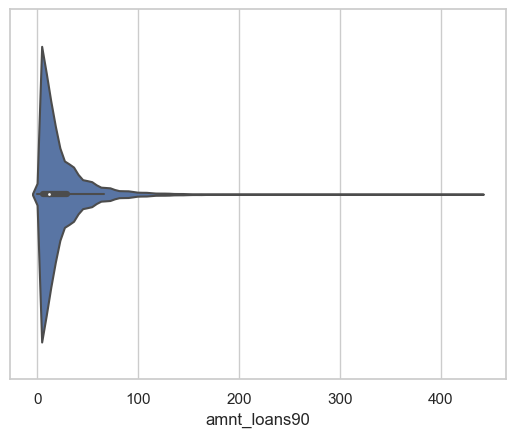

6      69131
12     38908
18     23867
24     17216
30     12503
       ...  
438        1
360        1
372        1
402        1
426        1
Name: amnt_loans90, Length: 69, dtype: int64

In [58]:
sns.set(style='whitegrid')
sns.violinplot(df1['amnt_loans90'])
plt.show()

df1['amnt_loans90'].value_counts()

<b>As we can see, total amount of loans taken by user in last 90 days for majority of the customers is 6.</b>

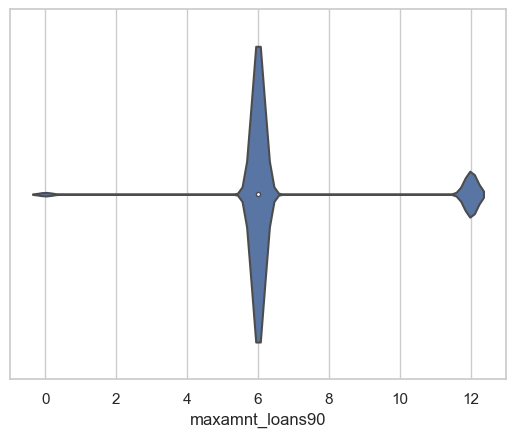

6     180945
12     26605
0       2043
Name: maxamnt_loans90, dtype: int64

In [59]:
sns.set(style='whitegrid')
sns.violinplot(df1['maxamnt_loans90'])
plt.show()

df1['maxamnt_loans90'].value_counts()

<b>As we can see, maximum amount of loan taken by the user in last 90 days for majority of the customers is 6.</b>

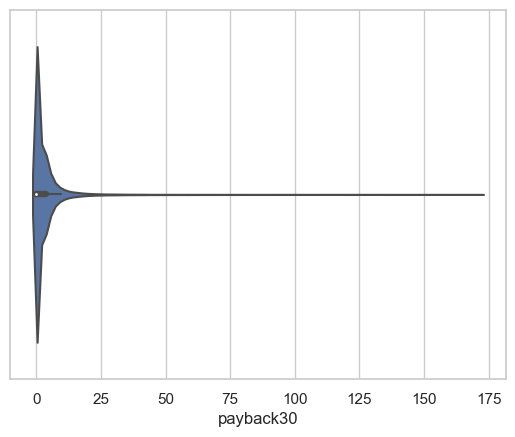

0.000000     106712
2.000000       5601
3.000000       5023
4.000000       3931
2.500000       3518
              ...  
4.545455          1
48.400000         1
3.133333          1
1.518519          1
5.615385          1
Name: payback30, Length: 1363, dtype: int64

In [60]:
sns.set(style='whitegrid')
sns.violinplot(df1['payback30'])
plt.show()

df1['payback30'].value_counts()

<b>As we can see, average payback time in days over last 30 days for majority of the customers is 0.</b>

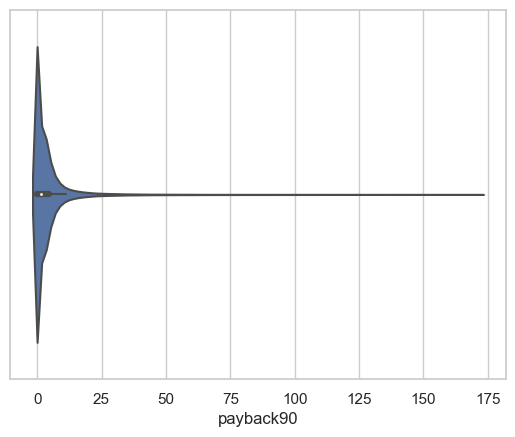

0.000000     95699
2.000000      4982
3.000000      4437
4.000000      3610
2.500000      3015
             ...  
35.625000        1
48.400000        1
8.363636         1
62.666667        1
25.846154        1
Name: payback90, Length: 2381, dtype: int64

In [61]:
sns.set(style='whitegrid')
sns.violinplot(df1['payback90'])
plt.show()

df1['payback90'].value_counts()

<b>As we can see, average payback time in days over last 90 days for majority of the customers is 0.</b>

# Bivariate Analysis

<Figure size 1000x500 with 0 Axes>

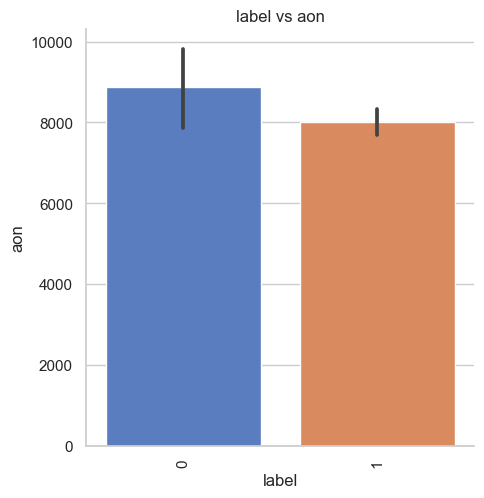

aon            label
1.000000       1        70
               0        44
2.000000       1        15
               0         9
3.000000       0         8
                        ..
999190.832139  1         1
999215.597054  1         1
999391.307123  1         1
999520.609388  1         1
999860.755168  1         1
Name: label, Length: 6592, dtype: int64


In [62]:
#Factor plot of label vs aon

plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='aon', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs aon')
plt.xticks(rotation='vertical')
plt.ylabel('aon')
plt.show()

print(df1.groupby('aon')['label'].value_counts())

<b>As the age on cellular network increases, the chances of default increases.</b>

<Figure size 1000x500 with 0 Axes>

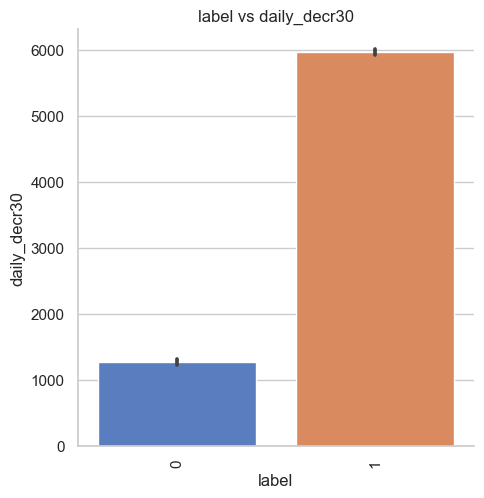

daily_decr30   label
0.000000       0        3611
               1         533
0.000667       0           5
0.001333       0           1
0.001667       0           2
                        ... 
183850.000000  1           1
185313.000000  1           1
212202.000000  1           1
212364.000000  1           1
265926.000000  1           1
Name: label, Length: 150382, dtype: int64


In [63]:
#Factor plot of label vs daily_decr30

plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='daily_decr30', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs daily_decr30')
plt.xticks(rotation='vertical')
plt.ylabel('daily_decr30')
plt.show()

print(df1.groupby('daily_decr30')['label'].value_counts())

<b>As the daily amount spent from main account, averaged over last 30 days increases, the chances of default decreases.</b>

<Figure size 1000x500 with 0 Axes>

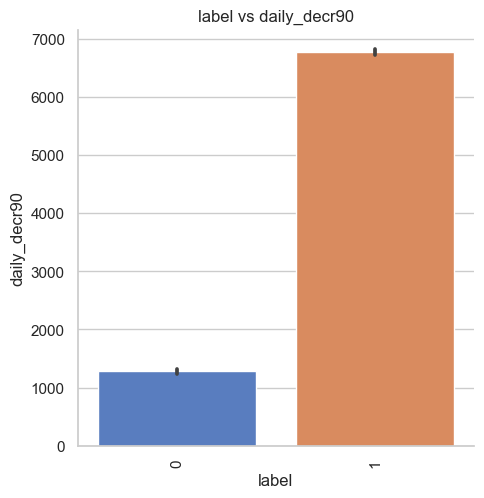

daily_decr90   label
0.000000       0        3611
               1         452
0.000667       0           5
0.001333       0           1
0.001667       0           2
                        ... 
231228.810000  1           1
244906.760000  1           1
254657.130000  1           1
259525.000000  1           1
320630.000000  1           1
Name: label, Length: 162828, dtype: int64


In [64]:
#Factor plot of label vs daily_decr90

plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='daily_decr90', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs daily_decr90')
plt.xticks(rotation='vertical')
plt.ylabel('daily_decr90')
plt.show()

print(df1.groupby('daily_decr90')['label'].value_counts())

<b>As the daily amount spent from main account, averaged over last 90 days increases, the chances of default decreases.</b>

<Figure size 1000x500 with 0 Axes>

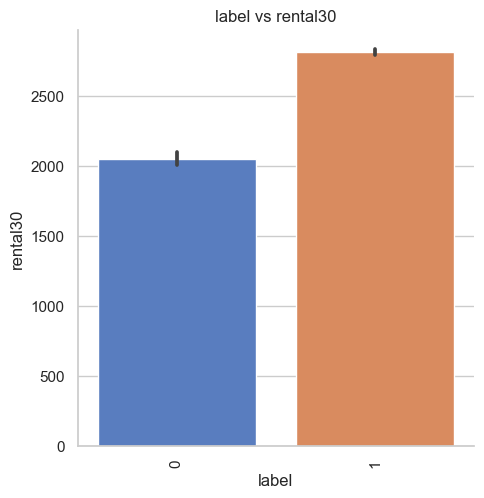

rental30   label
0.00       1        3912
           0        3654
0.01       1           1
0.04       1           2
0.06       1           1
                    ... 
104277.59  1           1
107663.98  1           1
124355.64  1           1
147045.42  1           1
198926.11  1           1
Name: label, Length: 135811, dtype: int64


In [65]:
#Factor plot of label vs rental30

plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='rental30', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs rental30')
plt.xticks(rotation='vertical')
plt.ylabel('rental30')
plt.show()

print(df1.groupby('rental30')['label'].value_counts())

<b>As the average main account balance over last 30 days increases, the chances of default decreases.</b>

<Figure size 1000x500 with 0 Axes>

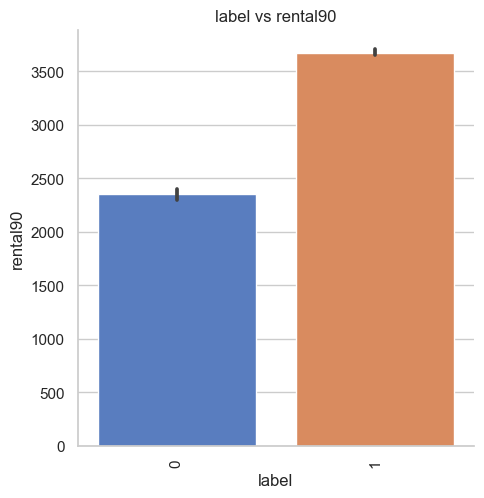

rental90   label
0.00       0        3654
           1        3264
0.01       1           1
0.04       1           2
0.06       1           1
                    ... 
157342.91  1           1
167673.70  1           1
169392.92  1           1
172084.42  1           1
200148.11  1           1
Name: label, Length: 144388, dtype: int64


In [66]:
#Factor plot of label vs rental90

plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='rental90', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs rental90')
plt.xticks(rotation='vertical')
plt.ylabel('rental90')
plt.show()

print(df1.groupby('rental90')['label'].value_counts())

<b>Average main account balance over last 90 days increases, the chances of default decreases.</b>

<Figure size 1000x500 with 0 Axes>

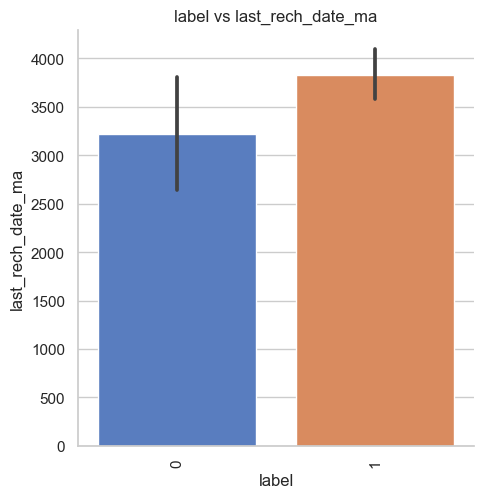

last_rech_date_ma  label
0.000000           1        11695
                   0         9048
1.000000           1        45564
                   0         1798
2.000000           1        24725
                            ...  
995749.962400      1            1
995837.737224      0            1
997676.760075      0            1
997717.809631      1            1
998650.377733      1            1
Name: label, Length: 1246, dtype: int64


In [67]:
#Factor plot of label vs last_rech_date_ma

plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='last_rech_date_ma', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs last_rech_date_ma')
plt.xticks(rotation='vertical')
plt.ylabel('last_rech_date_ma')
plt.show()

print(df1.groupby('last_rech_date_ma')['label'].value_counts())

<b>As the number of days till last recharge of main account increases, the chances of default decreases.</b>

<Figure size 1000x500 with 0 Axes>

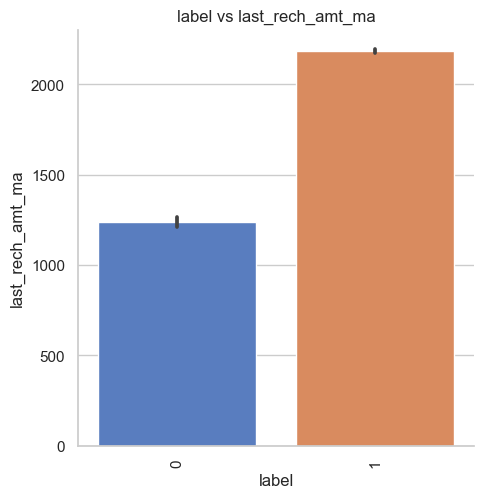

last_rech_amt_ma  label
0                 1        11805
                  0         9190
173               1          636
                  0          175
177               1            5
                           ...  
32000             1           22
                  0           10
34783             1            1
55000             1           20
                  0            8
Name: label, Length: 121, dtype: int64


In [68]:
#Factor plot of label vs last_rech_amt_ma

plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='last_rech_amt_ma', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs last_rech_amt_ma')
plt.xticks(rotation='vertical')
plt.ylabel('last_rech_amt_ma')
plt.show()

print(df1.groupby('last_rech_amt_ma')['label'].value_counts())

<b>As the amount of last recharge of main account increases, the chances of default decreases.</b>

<Figure size 1000x500 with 0 Axes>

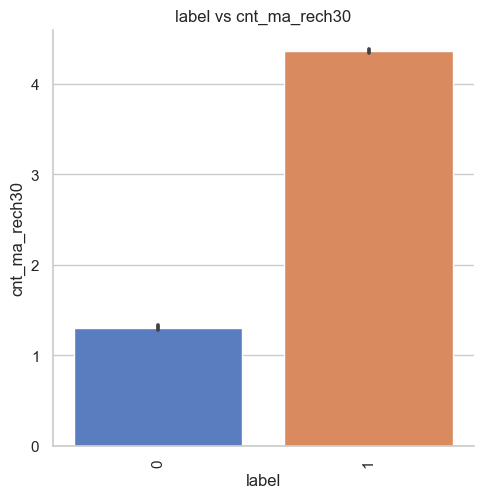

cnt_ma_rech30  label
0              1        16856
               0        11123
1              1        29561
               0         7677
2              1        27936
                        ...  
84             1            1
91             1            1
99             1            1
115            1            1
203            1            1
Name: label, Length: 103, dtype: int64


In [69]:
#Factor plot of label vs cnt_ma_rech30

plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='cnt_ma_rech30', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs cnt_ma_rech30')
plt.xticks(rotation='vertical')
plt.ylabel('cnt_ma_rech30')
plt.show()

print(df1.groupby('cnt_ma_rech30')['label'].value_counts())

<b>As the number of times main account got recharged in last 30 days increases, the chances of default decreases.</b>

<Figure size 1000x500 with 0 Axes>

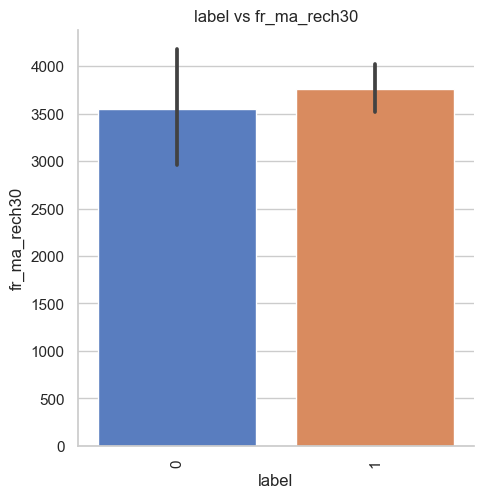

fr_ma_rech30   label
0.000000       1        59114
               0        19569
1.000000       1        21407
               0          963
2.000000       1        18135
                        ...  
996727.694990  1            1
997387.033771  1            1
999128.664262  1            1
999395.400286  1            1
999606.368132  1            1
Name: label, Length: 1115, dtype: int64


In [70]:
#Factor plot of label vs fr_ma_rech30

plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='fr_ma_rech30', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs fr_ma_rech30')
plt.xticks(rotation='vertical')
plt.ylabel('fr_ma_rech30')
plt.show()

print(df1.groupby('fr_ma_rech30')['label'].value_counts())

<b>As the frequency of main account recharged in last 30 days increases, the chances of default decreases.</b>

<Figure size 1000x500 with 0 Axes>

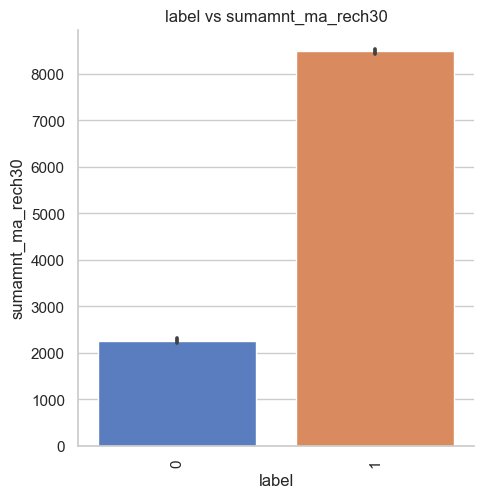

sumamnt_ma_rech30  label
0.0                1        16856
                   0        11123
173.0              1          364
                   0           81
177.0              1            1
                            ...  
232000.0           1            1
247227.0           1            1
275010.0           1            1
299391.0           1            1
810096.0           1            1
Name: label, Length: 16417, dtype: int64


In [71]:
#Factor plot of label vs sumamnt_ma_rech30

plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='sumamnt_ma_rech30', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs sumamnt_ma_rech30')
plt.xticks(rotation='vertical')
plt.ylabel('sumamnt_ma_rech30')
plt.show()

print(df1.groupby('sumamnt_ma_rech30')['label'].value_counts())

<b>As the total amount of recharge in main account over last 30 days increases, the chances of default decreases.</b>

<Figure size 1000x500 with 0 Axes>

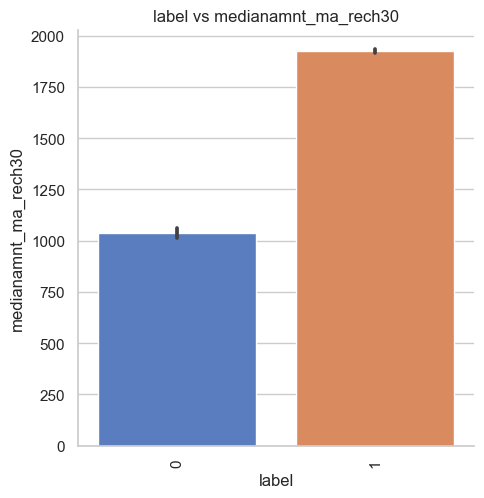

medianamnt_ma_rech30  label
0.0                   1        16856
                      0        11123
173.0                 1          464
                      0           90
177.0                 1            1
                               ...  
32000.0               0            4
33437.0               1            2
                      0            1
55000.0               1            7
                      0            3
Name: label, Length: 723, dtype: int64


In [72]:
#Factor plot of label vs medianamnt_ma_rech30

plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='medianamnt_ma_rech30', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs medianamnt_ma_rech30')
plt.xticks(rotation='vertical')
plt.ylabel('medianamnt_ma_rech30')
plt.show()

print(df1.groupby('medianamnt_ma_rech30')['label'].value_counts())

<b>As the median of amount of recharges done in main account over last 30 days at user level increases, the chances of default decreases.</b>

<Figure size 1000x500 with 0 Axes>

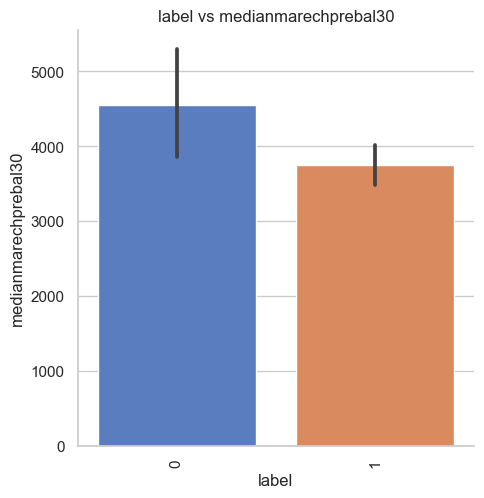

medianmarechprebal30  label
0.000000              1        19033
                      0        11647
0.010000              1           10
                      1            1
                      1            8
                               ...  
995816.957788         1            1
996556.547354         1            1
996826.781891         1            1
997896.677582         1            1
999479.419319         1            1
Name: label, Length: 33052, dtype: int64


In [73]:
#Factor plot of label vs medianmarechprebal30

plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='medianmarechprebal30', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs medianmarechprebal30')
plt.xticks(rotation='vertical')
plt.ylabel('medianmarechprebal30')
plt.show()

print(df1.groupby('medianmarechprebal30')['label'].value_counts())

<b>As the median of main account balance just before recharge in last 30 days at user level increases, the chances of default increases.</b>

<Figure size 1000x500 with 0 Axes>

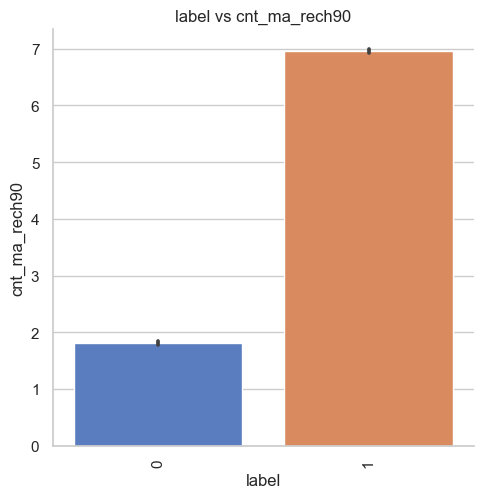

cnt_ma_rech90  label
0              1        11801
               0         9149
1              1        20409
               0         7489
2              1        20431
                        ...  
132            1            1
140            1            1
151            1            1
172            1            1
336            1            1
Name: label, Length: 150, dtype: int64


In [74]:
#Factor plot of label vs cnt_ma_rech90

plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='cnt_ma_rech90', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs cnt_ma_rech90')
plt.xticks(rotation='vertical')
plt.ylabel('cnt_ma_rech90')
plt.show()

print(df1.groupby('cnt_ma_rech90')['label'].value_counts())

<b>As the number of times main account got recharged in last 90 days increases, the chances of default decreases.</b>

<Figure size 1000x500 with 0 Axes>

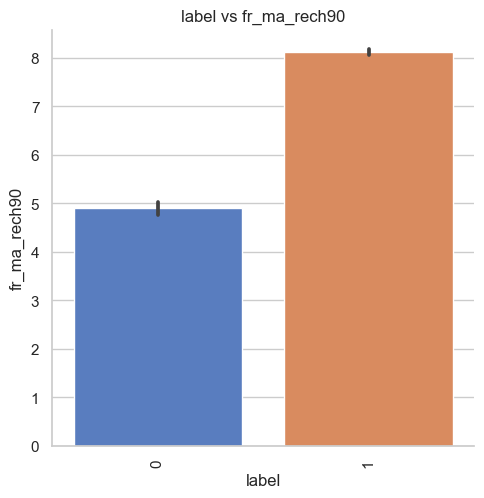

fr_ma_rech90  label
0             1        47958
              0        17795
1             1        23259
              0         1114
2             1        18495
                       ...  
85            0            4
86            1            6
              0            2
87            0            1
88            1            5
Name: label, Length: 176, dtype: int64


In [75]:
#Factor plot of label vs fr_ma_rech90

plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='fr_ma_rech90', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs fr_ma_rech90')
plt.xticks(rotation='vertical')
plt.ylabel('fr_ma_rech90')
plt.show()

print(df1.groupby('fr_ma_rech90')['label'].value_counts())

<b>As the frequency of main account recharged in last 90 days increases, the chances of default decreases.</b>

<Figure size 1000x500 with 0 Axes>

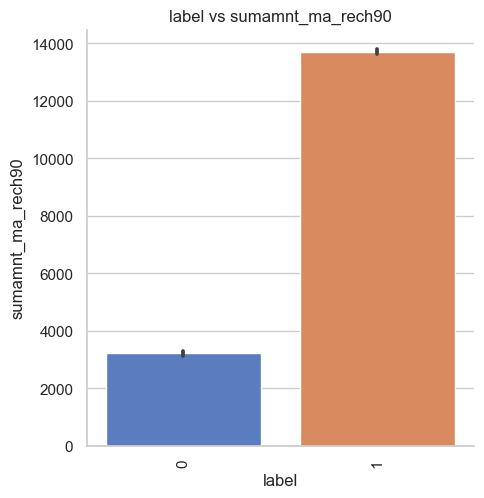

sumamnt_ma_rech90  label
0                  1        11801
                   0         9149
173                1          441
                   0          153
177                1            4
                            ...  
352813             1            1
383272             1            1
418133             1            1
429256             1            1
953036             1            1
Name: label, Length: 34069, dtype: int64


In [76]:
#Factor plot of label vs sumamnt_ma_rech90

plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='sumamnt_ma_rech90', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs sumamnt_ma_rech90')
plt.xticks(rotation='vertical')
plt.ylabel('sumamnt_ma_rech90')
plt.show()

print(df1.groupby('sumamnt_ma_rech90')['label'].value_counts())

<b>As the total amount of recharge in main account over last 90 days increases, the chances of default decreases.</b>

<Figure size 1000x500 with 0 Axes>

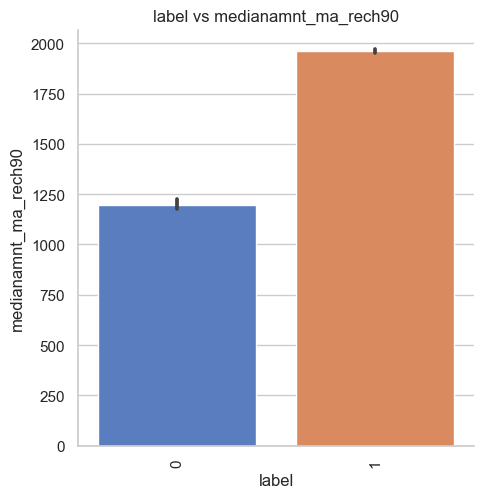

medianamnt_ma_rech90  label
0.0                   1        11801
                      0         9149
173.0                 1          763
                      0          183
175.0                 1            1
                               ...  
32500.0               1            1
33437.0               0            1
54400.0               0            1
55000.0               1            9
                      0            4
Name: label, Length: 903, dtype: int64


In [77]:
#Factor plot of label vs medianamnt_ma_rech90

plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='medianamnt_ma_rech90', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs medianamnt_ma_rech90')
plt.xticks(rotation='vertical')
plt.ylabel('medianamnt_ma_rech90')
plt.show()

print(df1.groupby('medianamnt_ma_rech90')['label'].value_counts())

<b>As the median of amount of recharges done in main account over last 90 days at user level increases, the chances of default decreases.</b>

<Figure size 1000x500 with 0 Axes>

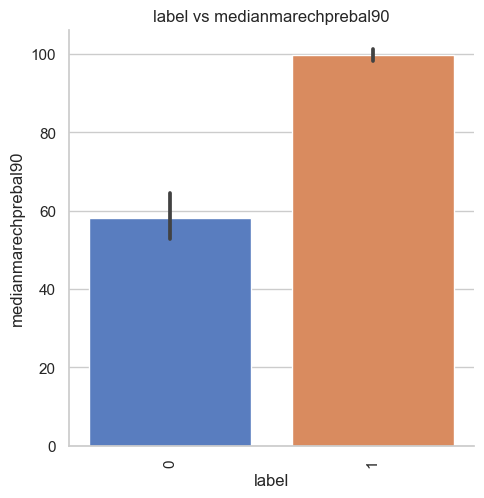

medianmarechprebal90  label
0.00                  1        13601
                      0         9790
0.01                  1            7
                      0            1
                      1           13
                               ...  
27544.10              1            1
27571.80              1            1
27611.70              0            1
35182.91              1            1
41456.50              1            1
Name: label, Length: 32700, dtype: int64


In [78]:
#Factor plot of label vs medianmarechprebal90

plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='medianmarechprebal90', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs medianmarechprebal90')
plt.xticks(rotation='vertical')
plt.ylabel('medianmarechprebal90')
plt.show()

print(df1.groupby('medianmarechprebal90')['label'].value_counts())

<b>As the median of main account balance just before recharge in last 90 days at user level increases, the chances of default decreases.</b>

<Figure size 1000x500 with 0 Axes>

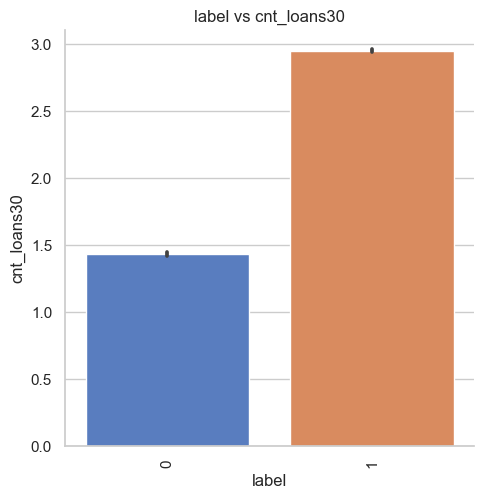

cnt_loans30  label
0            1         3259
1            1        63431
             0        20001
2            1        38927
             0         3738
3            1        25761
             0         1289
4            1        16943
             0          556
5            1        11422
             0          251
6            1         7653
             0          120
7            1         4967
             0           74
8            1         3340
             0           44
9            1         2249
             0           24
10           1         1552
             0           19
11           1         1134
             0            9
12           1          781
             0           12
13           1          539
             0            8
14           1          377
             0            6
15           1          269
             0            1
16           1          210
             0            3
17           1          161
             0            3
1

In [79]:
#Factor plot of label vs cnt_loans30

plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='cnt_loans30', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs cnt_loans30')
plt.xticks(rotation='vertical')
plt.ylabel('cnt_loans30')
plt.show()

print(df1.groupby('cnt_loans30')['label'].value_counts())

<b>As the number of loans taken by user in last 30 days increases, the chances of default decreases.</b>

<Figure size 1000x500 with 0 Axes>

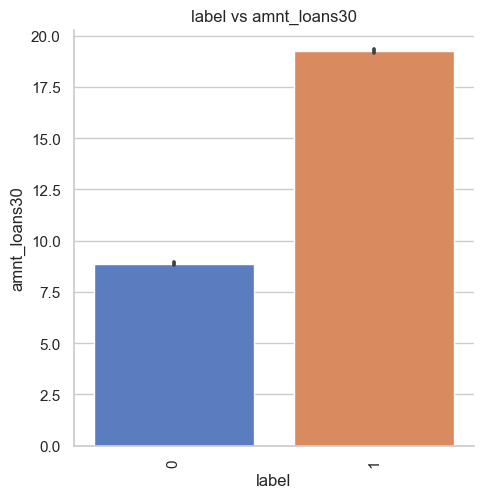

amnt_loans30  label
0             1         3259
6             1        56965
              0        19655
12            1        40591
              0         3793
                       ...  
264           1            3
270           1            1
276           1            3
300           1            1
306           1            1
Name: label, Length: 68, dtype: int64


In [80]:
#Factor plot of label vs amnt_loans30

plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='amnt_loans30', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs amnt_loans30')
plt.xticks(rotation='vertical')
plt.ylabel('amnt_loans30')
plt.show()

print(df1.groupby('amnt_loans30')['label'].value_counts())

<b>As the total amount of loans taken by user in last 30 days increases, the chances of default decreases.</b>

<Figure size 1000x500 with 0 Axes>

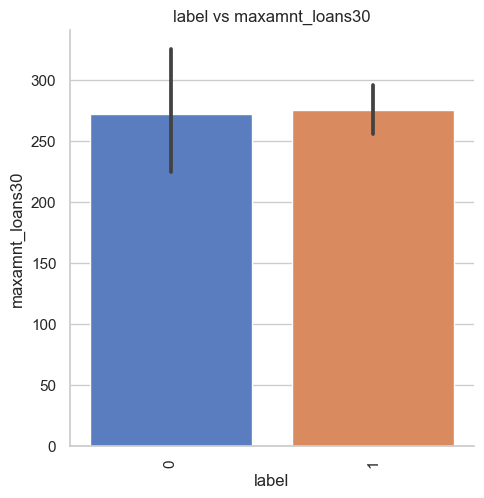

maxamnt_loans30  label
0.000000         1          3244
6.000000         1        154180
                 0         25013
12.000000        1         25089
                 0          1020
                           ...  
99358.403181     1             1
99571.106262     0             1
99600.070135     1             1
99788.550177     1             1
99864.560864     1             1
Name: label, Length: 1052, dtype: int64


In [81]:
#Factor plot of label vs maxamnt_loans30

plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='maxamnt_loans30', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs maxamnt_loans30')
plt.xticks(rotation='vertical')
plt.ylabel('maxamnt_loans30')
plt.show()

print(df1.groupby('maxamnt_loans30')['label'].value_counts())

<b>As the maximum amount of loan taken by the user in last 30 days increases, the chances of default decreases slightly.</b>

<Figure size 1000x500 with 0 Axes>

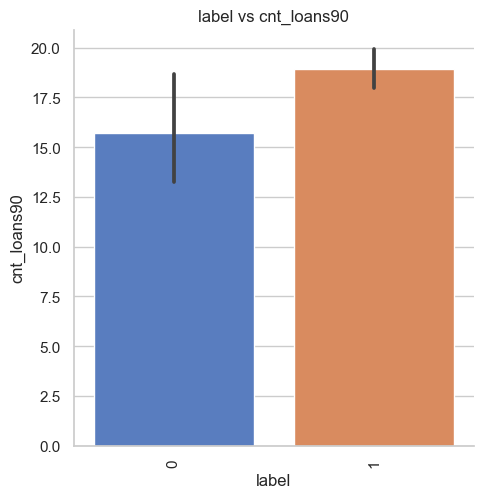

cnt_loans90  label
0.000000     1         2036
1.000000     1        54828
             0        19034
2.000000     1        33368
             0         3918
                      ...  
4981.993623  1            1
4983.979026  1            1
4987.330418  1            1
4992.821587  1            1
4997.517944  1            1
Name: label, Length: 1134, dtype: int64


In [82]:
#Factor plot of label vs cnt_loans90

plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='cnt_loans90', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs cnt_loans90')
plt.xticks(rotation='vertical')
plt.ylabel('cnt_loans90')
plt.show()

print(df1.groupby('cnt_loans90')['label'].value_counts())

<b>As the number of loans taken by user in last 90 days increases, the chances of default decreases.</b>

<Figure size 1000x500 with 0 Axes>

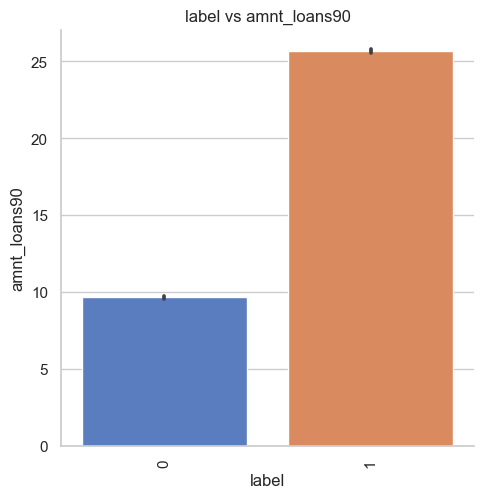

amnt_loans90  label
0             1         2043
6             1        50284
              0        18847
12            1        34941
              0         3967
                       ...  
396           1            1
402           1            1
408           1            4
426           1            1
438           1            1
Name: label, Length: 95, dtype: int64


In [83]:
#Factor plot of label vs amnt_loans90
plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='amnt_loans90', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs amnt_loans90')
plt.xticks(rotation='vertical')
plt.ylabel('amnt_loans90')
plt.show()

print(df1.groupby('amnt_loans90')['label'].value_counts())

<b>As the total amount of loans taken by user in last 90 days increases, the chances of default decreases.</b>

<Figure size 1000x500 with 0 Axes>

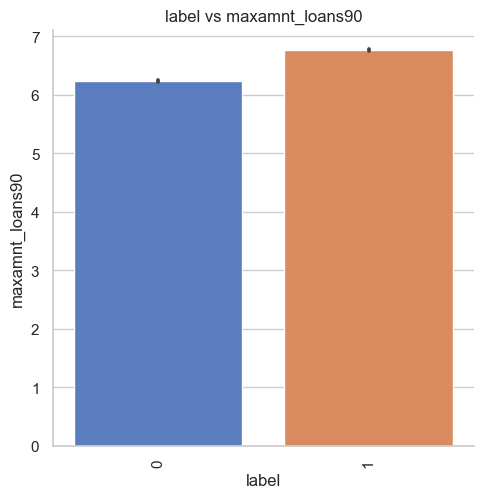

maxamnt_loans90  label
0                1          2043
6                1        155805
                 0         25140
12               1         25583
                 0          1022
Name: label, dtype: int64


In [84]:
#Factor plot of label vs maxamnt_loans90
plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='maxamnt_loans90', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs maxamnt_loans90')
plt.xticks(rotation='vertical')
plt.ylabel('maxamnt_loans90')
plt.show()

print(df1.groupby('maxamnt_loans90')['label'].value_counts())

<b>As the maximum amount of loan taken by the user in last 90 days increases, the chances of default decreases.</b>

<Figure size 1000x500 with 0 Axes>

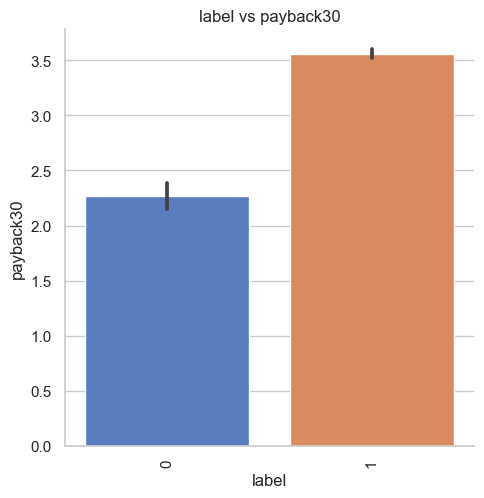

payback30   label
0.000000    1        84296
            0        22416
1.000000    1         2260
            0           19
1.041667    1            1
                     ...  
169.000000  1            2
169.500000  1            1
170.000000  1            1
170.500000  1            1
171.500000  1            1
Name: label, Length: 1835, dtype: int64


In [85]:
#Factor plot of label vs payback30
plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='payback30', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs payback30')
plt.xticks(rotation='vertical')
plt.ylabel('payback30')
plt.show()

print(df1.groupby('payback30')['label'].value_counts())

<b>As the average payback time in days over last 30 days increases, the chances of default decreases.</b>

<Figure size 1000x500 with 0 Axes>

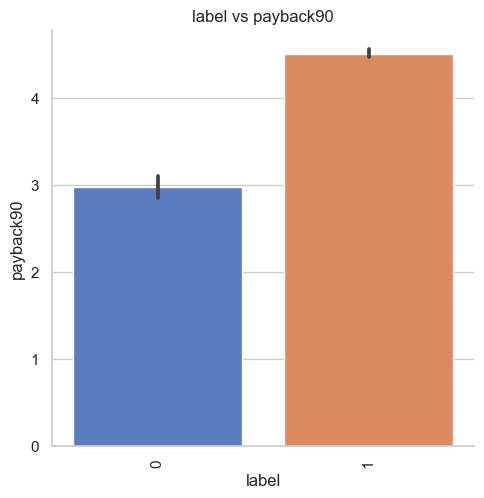

payback90   label
0.000000    1        73952
            0        21747
1.000000    1         2034
            0           21
1.055556    1            1
                     ...  
169.000000  1            2
169.500000  1            1
170.000000  1            1
170.500000  1            1
171.500000  1            1
Name: label, Length: 3000, dtype: int64


In [86]:
#Factor plot of label vs payback90
plt.figure(figsize=(10,5))
sns.factorplot(x='label', y='payback90', data=df1, kind='bar', size=5, palette='muted', aspect=1)
plt.title('label vs payback90')
plt.xticks(rotation='vertical')
plt.ylabel('payback90')
plt.show()

print(df1.groupby('payback90')['label'].value_counts())

<b>As the average payback time in days over last 90 days increases, the chances of default decreases.</b>

Day  label
1    1        6990
     0         834
2    1        6988
     0         851
3    1        6780
              ... 
29   1        4659
     0         418
30   1        4675
     0         454
31   1        2178
Name: label, Length: 61, dtype: int64


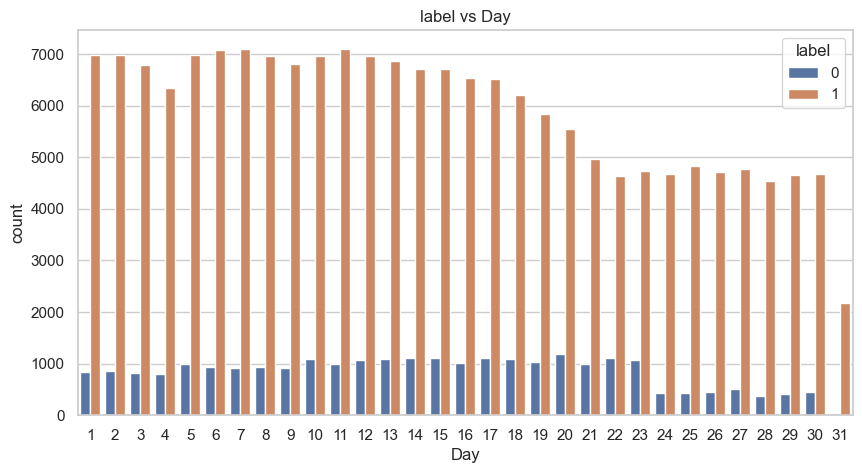

In [87]:
# Count plot of label vs Day
plt.figure(figsize=(10,5))
sns.countplot(x=df1['Day'],hue=df1['label'])
plt.title('label vs Day')

print(df1.groupby('Day')['label'].value_counts())

<b>As we can see, no significant observation is found from the above plot.</b>

Month  label
6      1        69893
       0        13261
7      1        72864
       0        12901
8      1        40674
Name: label, dtype: int64


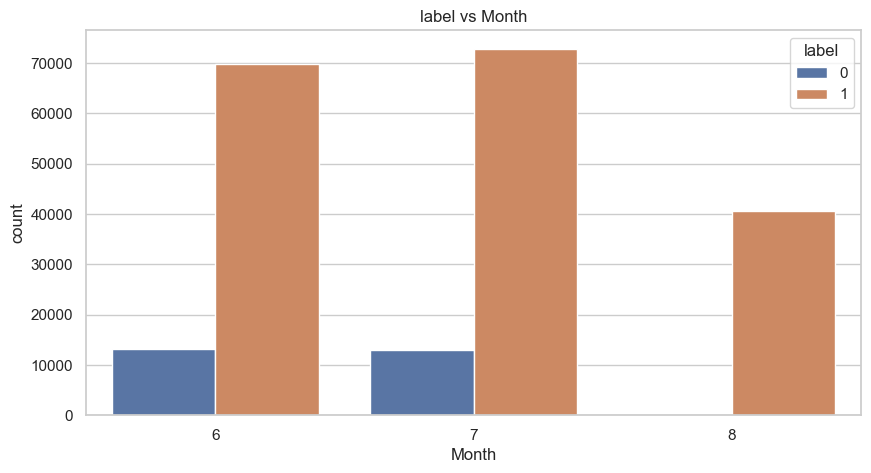

In [88]:
# Count plot of label vs Month
plt.figure(figsize=(10,5))
sns.countplot(x=df1['Month'],hue=df1['label'])
plt.title('label vs Month')

print(df1.groupby('Month')['label'].value_counts())

<b>As we can see, the chances of default decreases, if the loan is taken in the 7th month. Also, there are defaulters in the the 8th month.</b>

# Multivariate Analysis

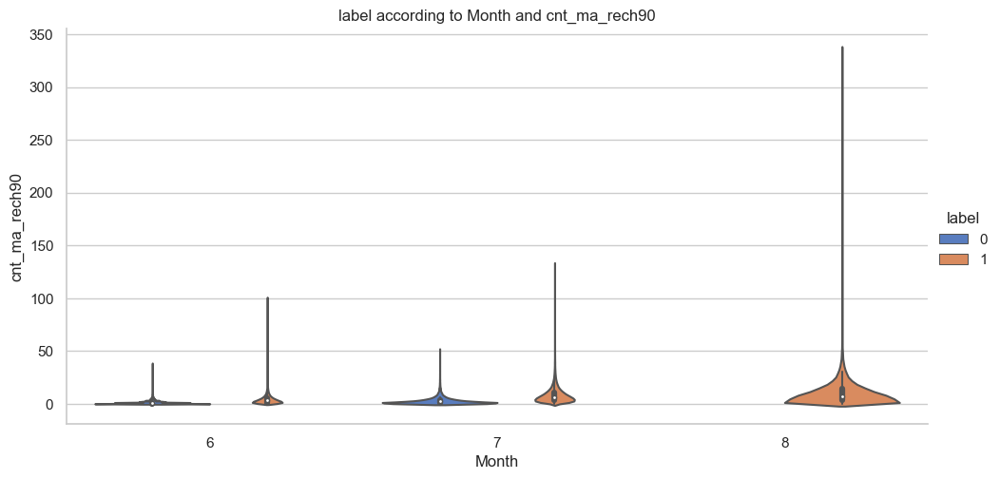

In [89]:
# Checking 'Month' and 'cnt_ma_rech90' with respect to 'label'

sns.factorplot(x='Month', y='cnt_ma_rech90', hue='label', data=df1, kind='violin', size=5, palette='muted', aspect=2)
plt.title('label according to Month and cnt_ma_rech90')
plt.xticks()
plt.ylabel('cnt_ma_rech90')
plt.show()

<b>As 'cnt_ma_rech90' increases in the 8th month, the number of non-defaulters also increases.</b>

<Figure size 1600x1600 with 0 Axes>

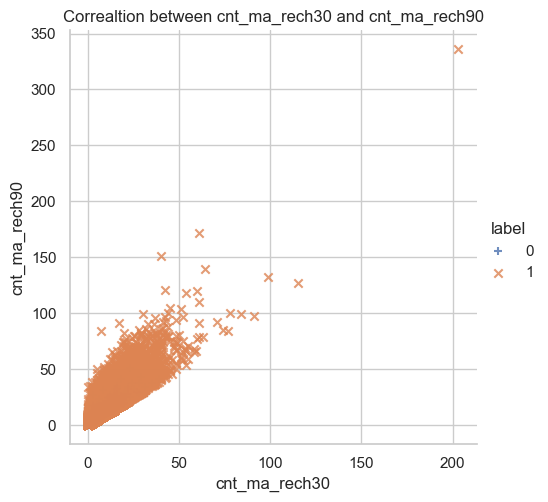

In [90]:
# Scatter plot between 'cnt_ma_rech_30' and 'cnt_ma_rech90' with respect to 'label'

plt.figure(figsize=(16,16))
sns.lmplot(x='cnt_ma_rech30', y='cnt_ma_rech90', fit_reg=False, data=df1, hue='label', markers=['+','x'])
plt.xlabel('cnt_ma_rech30')
plt.title('Correaltion between cnt_ma_rech30 and cnt_ma_rech90')
plt.ylabel('cnt_ma_rech90')
plt.show()

<b>As 'cnt_ma_rech30' and 'cnt_ma_rech90' are increasing the number of non-defaulters are also increasing.</b>

<Figure size 1600x1600 with 0 Axes>

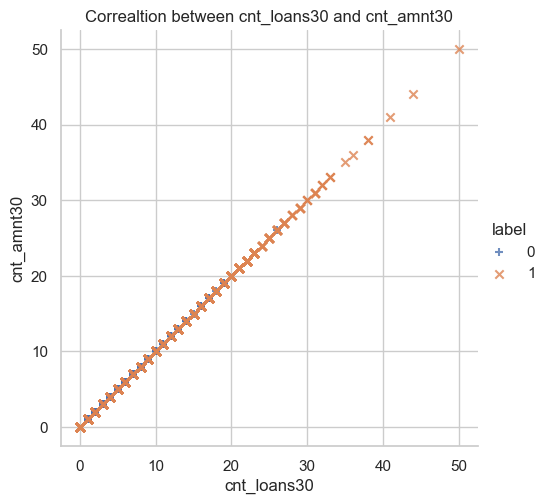

In [91]:
# Scatter plot between 'cnt_loans30' and 'cnt_amnt30' with respect to label

plt.figure(figsize=(16,16))
sns.lmplot(x='cnt_loans30', y='cnt_loans30', fit_reg=False, data=df1, hue='label', markers=['+','x'])
plt.xlabel('cnt_loans30')
plt.title('Correaltion between cnt_loans30 and cnt_amnt30')
plt.ylabel('cnt_amnt30')
plt.show()

<b>As 'cnt_loans30' and 'cnt_amnt30' are increasing the number of non-defaulters are also increasing.</b>

<Figure size 1600x1600 with 0 Axes>

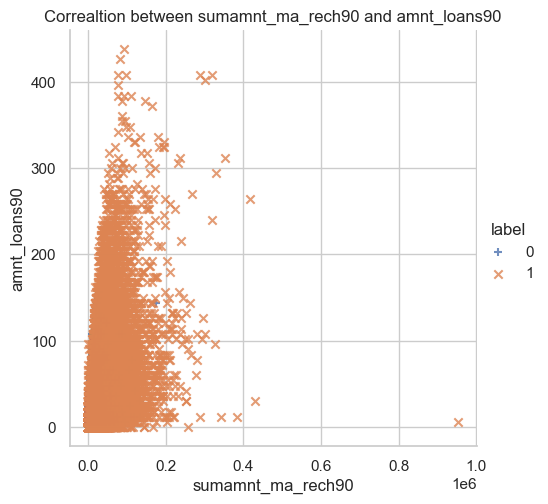

In [92]:
# Scatter plot between 'sumamnt_ma_rech90' and 'amnt_loans90' with respect to 'label'

plt.figure(figsize=(16,16))
sns.lmplot(x='sumamnt_ma_rech90', y='amnt_loans90', fit_reg=False, data=df1, hue='label', markers=['+','x'])
plt.xlabel('sumamnt_ma_rech90')
plt.title('Correaltion between sumamnt_ma_rech90 and amnt_loans90')
plt.ylabel('amnt_loans90')
plt.show()

<b>As 'sumamnt_rech90' and 'amnt_loans30' are increasing, the number of non-defaulters are also increasing.</b>

# Outlier Detection and Removal

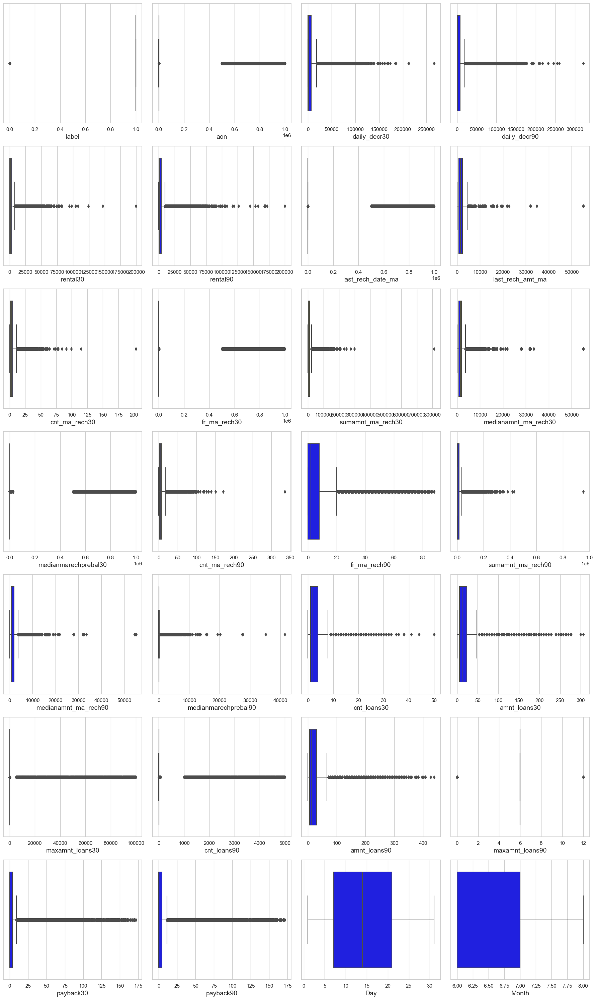

In [93]:
# Identifying the outliers using boxplot

plt.figure(figsize=(18,30),facecolor='white')
plotnumber=1
for column in df1:
    if plotnumber<=28:
        ax = plt.subplot(7,4,plotnumber)
        sns.boxplot(df1[column],color='blue')
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()

<b>As we can see, outliers are present in all the columns, except the columns 'Day' and 'Month'. As label is our target column, we need not remove outliers from it, as doing so would result in loss of data.</b>

# i) Zscore method

In [94]:
features= df1[['aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90',
       'last_rech_date_ma', 'last_rech_amt_ma', 'cnt_ma_rech30',
       'fr_ma_rech30', 'sumamnt_ma_rech30', 'medianamnt_ma_rech30',
       'medianmarechprebal30', 'cnt_ma_rech90', 'fr_ma_rech90',
       'sumamnt_ma_rech90', 'medianamnt_ma_rech90', 'medianmarechprebal90',
       'cnt_loans30', 'amnt_loans30', 'maxamnt_loans30', 'cnt_loans90',
       'amnt_loans90', 'maxamnt_loans90', 'payback30', 'payback90']]


from scipy.stats import zscore

z = np.abs(zscore(features))

In [95]:
# Creating new dataframe by setting z to 3

df2 = df1[(z<3).all(axis=1)] 
df2

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,Day,Month
0,0,272.0,3055.050000,3065.150000,220.13,260.13,2.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,2,12,6.0,2.0,12,6,29.000000,29.000000,20,7
1,1,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,1,12,12.0,1.0,12,12,0.000000,0.000000,10,8
2,1,535.0,1398.000000,1398.000000,900.13,900.13,3.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,1,6,6.0,1.0,6,6,0.000000,0.000000,19,8
3,1,241.0,21.228000,21.228000,159.42,159.42,41.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,2,12,6.0,2.0,12,6,0.000000,0.000000,6,6
4,1,947.0,150.619333,150.619333,1098.90,1098.90,4.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,7,42,6.0,7.0,42,6,2.333333,2.333333,22,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209588,1,404.0,151.872333,151.872333,1089.19,1089.19,1.0,4048,3,2.0,10404.0,3178.0,91.81,3,2,10404,3178.0,91.81,2,12,6.0,2.0,12,6,1.000000,1.000000,17,6
209589,1,1075.0,36.936000,36.936000,1728.36,1728.36,4.0,773,4,1.0,3092.0,773.0,161.30,6,2,4038,773.0,111.80,3,18,6.0,3.0,18,6,1.000000,1.000000,12,6
209590,1,1013.0,11843.111667,11904.350000,5861.83,8893.20,3.0,1539,5,8.0,9334.0,1539.0,51.13,11,5,18592,1539.0,47.13,4,42,12.0,6.0,54,12,4.000000,3.833333,29,7
209591,1,1732.0,12488.228333,12574.370000,411.83,984.58,2.0,773,5,4.0,12154.0,773.0,164.00,6,4,17941,2410.5,100.00,2,18,12.0,3.0,24,12,0.000000,10.500000,25,7


In [96]:
# Checking the shape of dataset before and after removing outliers

print("Shape of dataset before removing outliers:", df1.shape)
print("Shape of dataset after removing outliers:", df2.shape)

Shape of dataset before removing outliers: (209593, 28)
Shape of dataset after removing outliers: (171215, 28)


In [97]:
# Checking the the data loss after removing outliers

data_loss = (209593-171215)/209593*100
data_loss

18.310726026155454

<b>By using Zscore method, we are losing around 19% of data which is not acceptable. The acceptable range of data loss is 7-8%. So let's try to remove outliers using IQR method.</b>

# ii) IQR (Inter Quartile Range) Method

In [98]:
# 1st quantile
Q1=features.quantile(0.25)

# 3rd quantile
Q3=features.quantile(0.75)

# IQR
IQR=Q3 - Q1

df3=df1[~((df1 < (Q1 - 1.5 * IQR)) |(df1 > (Q3 + 1.5 * IQR))).any(axis=1)]

In [99]:
print("Shape of data after using IQR method:", df3.shape)

Shape of data after using IQR method: (78184, 28)


In [100]:
# Checking the the data loss after removing outliers

data_loss = (209593-78184)/209593*100
data_loss

62.6972274837423

<b>By using IQR method, we are losing around 63% of data, which is not acceptable. So let's try to remove outliers by setting the data loss to 2%.</b>

# iii) Percentile Method

In [101]:
#Removing outliers using percentile method in train dataset

for col in features:
    if df1[col].dtypes != 'object':
        percentile = df1[col].quantile([0.01,0.98]).values
        df1[col][df1[col]<=percentile[0]]=percentile[0]
        df1[col][df1[col]>=percentile[1]]=percentile[1]

<b>We have successfully removed the outliers using the Percentile method.</b>

# Checking for skewness

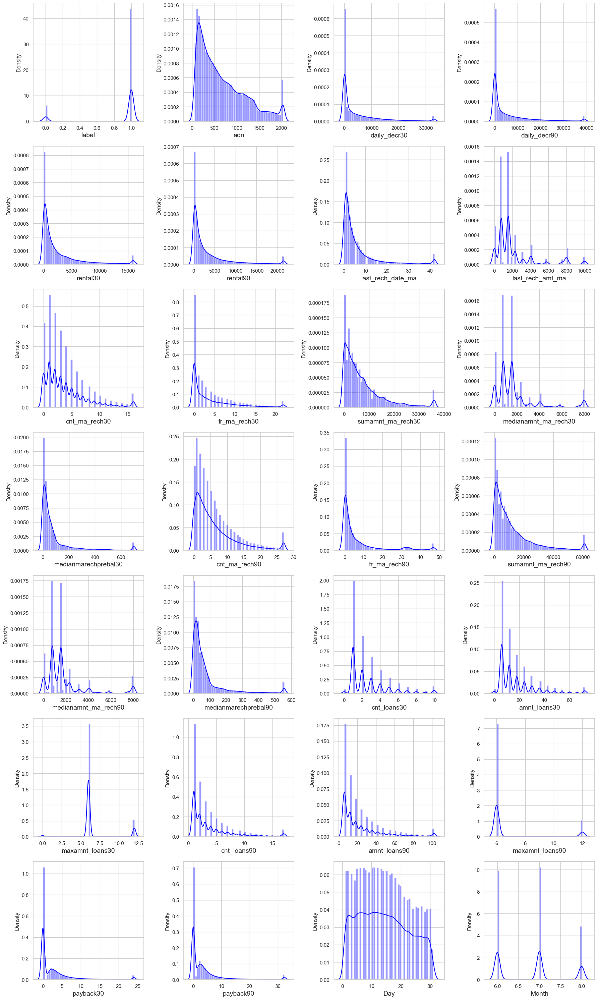

In [102]:
# Checking how the data has been distriubted in each column

plt.figure(figsize=(18,30),facecolor='white')
plotnumber=1
for column in df1:
    if plotnumber<=28:
        ax = plt.subplot(7,4,plotnumber)
        sns.distplot(df1[column], color='blue')
        plt.xlabel(column, fontsize=14)
    plotnumber+=1
plt.tight_layout()

In [103]:
df1.skew()

label                  -2.270254
aon                     0.935197
daily_decr30            1.974398
daily_decr90            2.091663
rental30                2.115274
rental90                2.203455
last_rech_date_ma       2.541537
last_rech_amt_ma        2.080016
cnt_ma_rech30           1.415594
fr_ma_rech30            1.703205
sumamnt_ma_rech30       1.750999
medianamnt_ma_rech30    2.115971
medianmarechprebal30    2.812125
cnt_ma_rech90           1.569282
fr_ma_rech90            1.985638
sumamnt_ma_rech90       1.863547
medianamnt_ma_rech90    2.133303
medianmarechprebal90    2.639138
cnt_loans30             1.576547
amnt_loans30            1.733837
maxamnt_loans30         1.405285
cnt_loans90             1.923139
amnt_loans90            1.840032
maxamnt_loans90         2.241299
payback30               2.648819
payback90               2.829305
Day                     0.199845
Month                   0.343242
dtype: float64

<b>As we can see, skewness is present in all the columns, except the columns 'Day' and 'Month'. As label is our target column, we need not remove outliers from it. Lets remove the columns having skewness more than +0.5 & -0.5 using power transformation method.</b> 

In [104]:
features= ['aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90',
       'last_rech_date_ma', 'last_rech_amt_ma', 'cnt_ma_rech30',
       'fr_ma_rech30', 'sumamnt_ma_rech30', 'medianamnt_ma_rech30',
       'medianmarechprebal30', 'cnt_ma_rech90', 'fr_ma_rech90',
       'sumamnt_ma_rech90', 'medianamnt_ma_rech90', 'medianmarechprebal90',
       'cnt_loans30', 'amnt_loans30', 'maxamnt_loans30', 'cnt_loans90',
       'amnt_loans90', 'maxamnt_loans90', 'payback30', 'payback90']

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box-cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box-cox' or 'yeo-johnson'\n"

In [105]:
df1[features] = scaler.fit_transform(df1[features].values)
df1[features]

,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90
0,-0.696438,0.494127,0.471080,-0.816943,-0.806214,-0.339490,0.081985,-0.292754,1.713444,-0.192082,0.210453,-0.731853,-0.592539,1.341883,-0.459913,0.147199,-0.861667,0.005250,-0.105640,-0.269609,-0.182317,-0.195308,-1.948303e-13,1.785799,1.821484
1,0.388296,1.119747,1.071452,0.788861,0.623891,1.533669,1.531119,-0.813308,-1.125020,0.221233,1.693348,0.382067,-1.036320,-1.206931,-0.096105,1.751936,0.358453,-0.917748,-0.105640,2.275299,-1.129610,-0.195308,1.340081e-12,-0.938528,-1.019522
2,0.042606,0.177645,0.162866,-0.127096,-0.225085,-0.011661,0.081985,-0.813308,-1.125020,-0.559381,0.210453,0.434226,-1.036320,-1.206931,-0.785812,0.147199,0.417502,-0.917748,-0.905221,-0.269609,-1.129610,-1.184033,-1.948303e-13,-0.938528,-1.019522
3,-0.817739,-1.127276,-1.124934,-0.949309,-1.000258,2.035072,-0.297745,-1.676293,-1.125020,-1.899447,-1.962023,-1.651468,-1.036320,-1.206931,-0.976052,-0.264481,-1.291484,0.005250,-0.105640,-0.269609,-0.182317,-0.195308,-1.948303e-13,-0.938528,-1.019522
4,0.754834,-0.592438,-0.592181,-0.012681,-0.118293,0.229214,0.454627,1.016428,0.160683,1.323060,0.589603,-0.058536,0.664361,-0.062417,1.014437,0.808981,-0.015649,1.608532,1.499492,-0.269609,1.235280,1.166897,-1.948303e-13,0.640306,0.428035
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209588,-0.277218,-0.589905,-0.589675,-0.017867,-0.123129,-0.836816,1.069436,0.083815,0.160683,0.687672,0.931278,0.644682,-0.271203,-0.062417,0.311453,0.924348,0.657377,0.005250,-0.105640,-0.269609,-0.182317,-0.195308,-1.948303e-13,0.092407,-0.104773
209589,0.925010,-0.989053,-0.986493,0.264529,0.139515,0.229214,-0.437741,0.380110,-0.270330,-0.189399,-0.315159,1.032423,0.369644,-0.062417,-0.312091,-0.415078,0.809320,0.557541,0.394877,-0.269609,0.340924,0.305428,-1.948303e-13,0.092407,-0.104773
209590,0.844700,1.108411,1.062900,1.149500,1.278777,-0.011661,0.081985,0.624962,1.118037,0.594652,0.210453,0.272742,1.007109,0.509642,0.794093,0.147199,0.179835,0.935485,1.499492,2.275299,1.095711,1.378295,1.340081e-12,0.979695,0.754284
209591,1.607797,1.134285,1.088471,-0.534006,-0.177584,-0.339490,-0.437741,0.624962,0.641001,0.826676,-0.315159,1.044299,0.369644,0.368932,0.761914,0.602319,0.722659,0.005250,0.394877,2.275299,0.340924,0.625139,1.340081e-12,-0.938528,1.354948


In [106]:
# Checking skewness after using yeo-johnson method

df1[features].skew()

aon                    -0.059160
daily_decr30           -0.141351
daily_decr90           -0.130982
rental30               -0.063274
rental90               -0.063135
last_rech_date_ma       0.044329
last_rech_amt_ma       -0.096659
cnt_ma_rech30          -0.010127
fr_ma_rech30            0.133182
sumamnt_ma_rech30      -0.369884
medianamnt_ma_rech30   -0.239052
medianmarechprebal30   -0.045899
cnt_ma_rech90          -0.012068
fr_ma_rech90            0.140655
sumamnt_ma_rech90      -0.265438
medianamnt_ma_rech90   -0.100228
medianmarechprebal90   -0.029268
cnt_loans30             0.042626
amnt_loans30            0.006048
maxamnt_loans30         0.399869
cnt_loans90             0.206928
amnt_loans90            0.133935
maxamnt_loans90         0.000000
payback30               0.287988
payback90               0.201580
dtype: float64

<b>As we can see, skewness is removed from all the columns.</b>

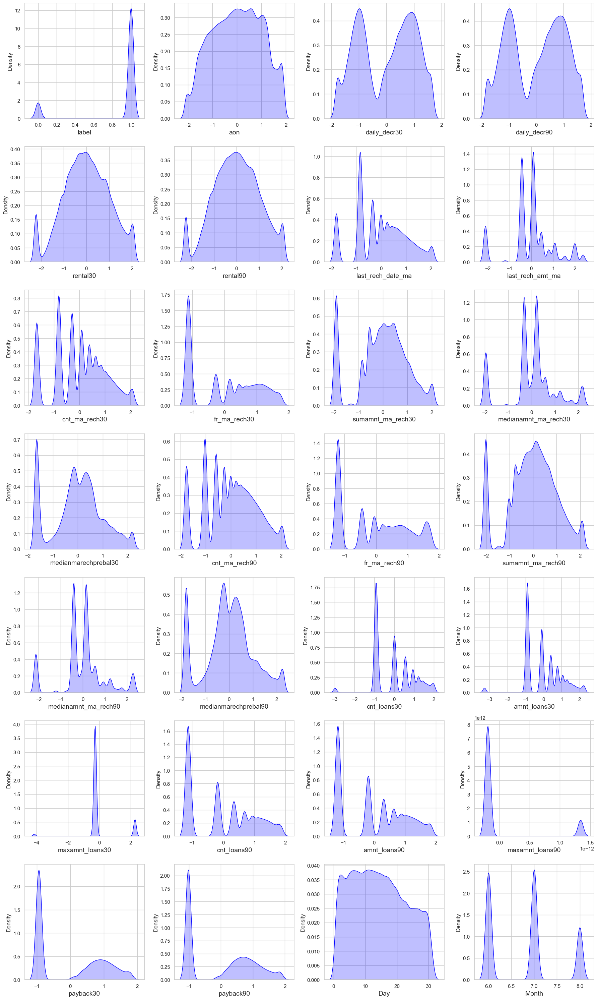

In [107]:
# Checking how the data has been distriubted in each column after removing skewness

plt.figure(figsize=(18,30),facecolor='white')
plotnumber = 1
for column in df1:
    if plotnumber<=28:
        ax = plt.subplot(7,4,plotnumber)
        sns.distplot(df1[column], color='blue', kde_kws={"shade": True}, hist=False)
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()

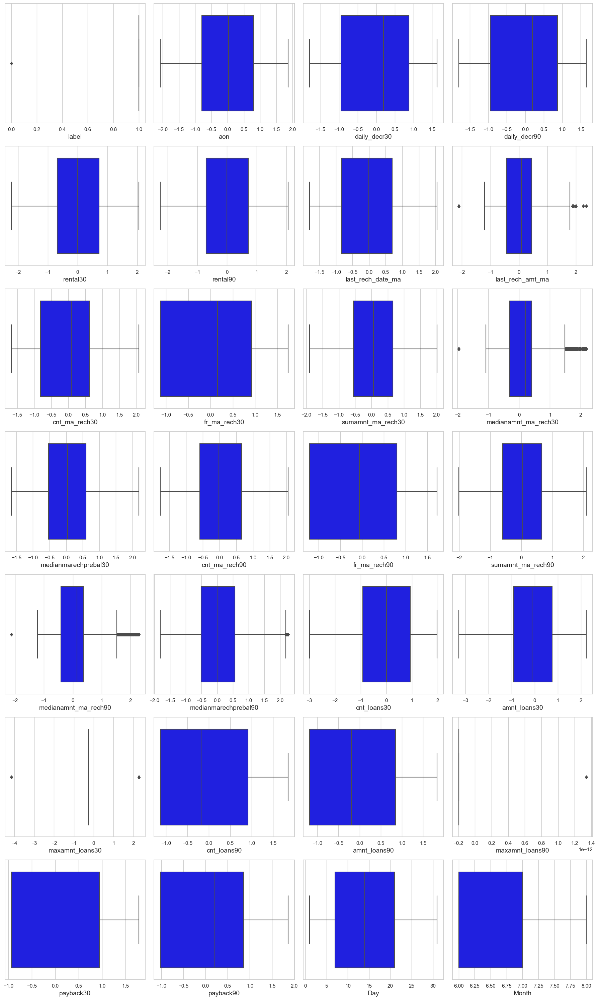

In [108]:
# Checking the outliers after using percentile method

plt.figure(figsize=(18,30),facecolor='white')
plotnumber = 1
for column in df1:
    if plotnumber<=28:
        ax=plt.subplot(7,4,plotnumber)
        sns.boxplot(df1[column], color='blue')
        plt.xlabel(column, fontsize=14)
    plotnumber+=1
plt.tight_layout()

<b>As we can see, outliers are almost removed in many columns after using Percentile method and after removing skewness.</b>

# Correlation between the label and features

In [109]:
cor = df1.corr()
cor

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,Day,Month
label,1.000000,0.096267,0.267056,0.269522,0.142204,0.156705,0.065764,0.261558,0.344106,0.241559,0.358799,0.277643,0.264868,0.361987,0.220134,0.368684,0.252438,0.256673,0.234579,0.233895,0.059609,0.287740,0.302689,0.099686,0.232627,0.240341,0.006825,0.154949
aon,0.096267,1.000000,0.115717,0.116326,0.083372,0.091223,0.062095,0.097955,0.037108,0.069588,0.080562,0.097277,0.057026,0.058066,0.075321,0.097926,0.103318,0.058464,0.073933,0.074585,0.029566,0.116080,0.118641,0.038817,0.081135,0.111311,0.016448,0.086131
daily_decr30,0.267056,0.115717,1.000000,0.998328,0.583840,0.640817,0.124668,0.376118,0.495417,0.296000,0.554458,0.388880,0.274642,0.627033,0.219822,0.663845,0.366157,0.244357,0.341657,0.394816,0.293102,0.517784,0.571143,0.403148,0.328779,0.404245,-0.009166,0.816993
daily_decr90,0.269522,0.116326,0.998328,1.000000,0.584062,0.645831,0.128715,0.375746,0.490856,0.295068,0.549137,0.385740,0.273267,0.630612,0.220905,0.666929,0.366491,0.245195,0.335047,0.388839,0.291629,0.518885,0.572560,0.406070,0.326097,0.404871,-0.016237,0.830246
rental30,0.142204,0.083372,0.583840,0.584062,1.000000,0.973267,0.054789,0.284288,0.454494,0.248022,0.481511,0.322414,0.224414,0.509933,0.161965,0.518253,0.272765,0.179244,0.311012,0.341526,0.207849,0.417471,0.447287,0.276141,0.307758,0.342924,0.101982,0.417779
rental90,0.156705,0.091223,0.640817,0.645831,0.973267,1.000000,0.088574,0.295280,0.445557,0.249853,0.470255,0.313758,0.220681,0.537415,0.175607,0.544569,0.283442,0.188766,0.294167,0.329390,0.212644,0.435248,0.468701,0.302381,0.304173,0.359453,0.084642,0.505501
last_rech_date_ma,0.065764,0.062095,0.124668,0.128715,0.054789,0.088574,1.000000,0.517311,-0.021157,0.057784,0.114665,0.324497,0.188150,0.095034,0.218692,0.249151,0.507089,0.336528,-0.106417,-0.107861,-0.026412,-0.032599,-0.028060,0.013783,-0.099599,-0.026865,0.031441,0.076522
last_rech_amt_ma,0.261558,0.097955,0.376118,0.375746,0.284288,0.295280,0.517311,1.000000,0.321219,0.271814,0.652559,0.811083,0.426718,0.373169,0.336927,0.701542,0.902139,0.490801,0.144867,0.164279,0.130890,0.211549,0.240275,0.183079,0.143458,0.180046,0.057765,0.154444
cnt_ma_rech30,0.344106,0.037108,0.495417,0.490856,0.454494,0.445557,-0.021157,0.321219,1.000000,0.418862,0.857121,0.415131,0.484221,0.920818,0.220237,0.778120,0.286052,0.388709,0.700620,0.697461,0.183510,0.706690,0.719248,0.195099,0.546511,0.488965,0.097636,0.192337
fr_ma_rech30,0.241559,0.069588,0.296000,0.295068,0.248022,0.249853,0.057784,0.271814,0.418862,1.000000,0.460805,0.381173,0.306109,0.410987,0.613784,0.421736,0.291046,0.225408,0.298338,0.283388,0.093838,0.350050,0.361689,0.102132,0.413674,0.392590,0.080686,0.131977


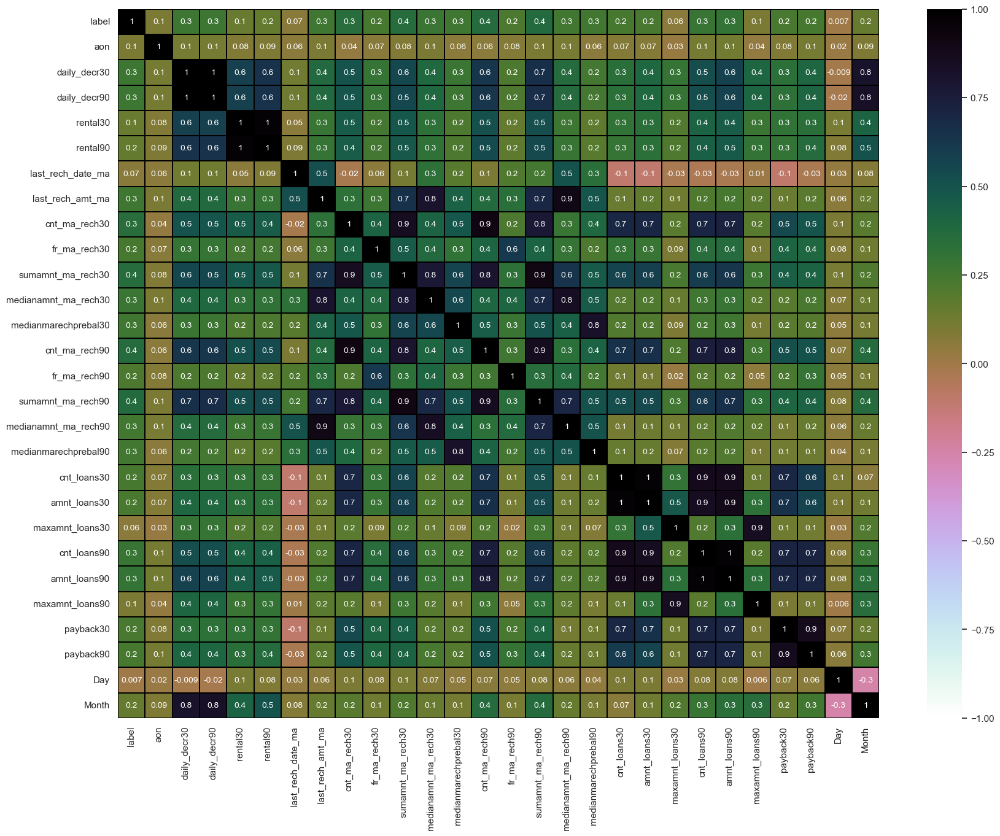

In [110]:
# Visualizing the correlation matrix by plotting heat map.

plt.figure(figsize=(20,15))    
sns.heatmap(df1.corr(),linewidths=.1,vmin=-1, vmax=1,fmt='.1g',linecolor="black",annot=True,cmap="cubehelix_r",annot_kws={'size':10})
plt.yticks(rotation=0);

<b>This heatmap shows the correlation matrix of the data. We can observe the relation between one feature to other and relation between features and label. Here we can notice there is no strong relation between features and label.
Dark shades are highly positively correlated with the label and light shades are highly negatively correlated with the label.</b>

<b>The features 'sumamnt_ma_rech30', 'sumamnt_ma_rech90', 'daily_decr30', 'daily_decr30', 'cnt_ma_rech30', 'cnt_ma_rech90', 'cnt_loans30', 'cnt_loans90', 'amnt_loans30' and 'amnt_loans90' have somewhat strong correlation with the label of defaulters and non-defaulters data. Also, we can observe there are no negative correlation between label and features. Most of the features are correlated with each other.</b>

In [111]:
cor['label'].sort_values(ascending=False)

label                   1.000000
sumamnt_ma_rech90       0.368684
cnt_ma_rech90           0.361987
sumamnt_ma_rech30       0.358799
cnt_ma_rech30           0.344106
amnt_loans90            0.302689
cnt_loans90             0.287740
medianamnt_ma_rech30    0.277643
daily_decr90            0.269522
daily_decr30            0.267056
medianmarechprebal30    0.264868
last_rech_amt_ma        0.261558
medianmarechprebal90    0.256673
medianamnt_ma_rech90    0.252438
fr_ma_rech30            0.241559
payback90               0.240341
cnt_loans30             0.234579
amnt_loans30            0.233895
payback30               0.232627
fr_ma_rech90            0.220134
rental90                0.156705
Month                   0.154949
rental30                0.142204
maxamnt_loans90         0.099686
aon                     0.096267
last_rech_date_ma       0.065764
maxamnt_loans30         0.059609
Day                     0.006825
Name: label, dtype: float64

# Visualizing the correlation between label and features using bar plot

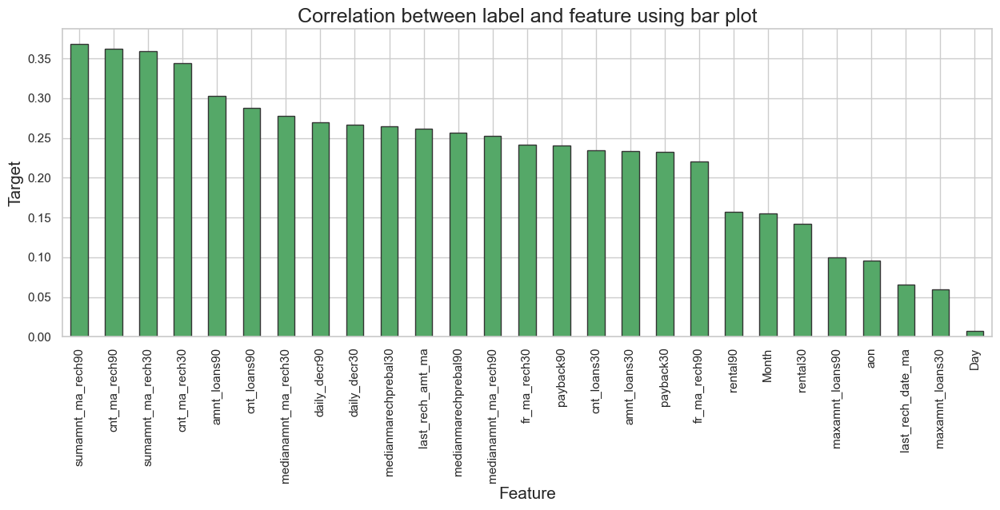

In [112]:
plt.figure(figsize=(15,5))
df1.corr()['label'].sort_values(ascending=False).drop(['label']).plot(kind='bar',color='g',edgecolor=".2")
plt.xlabel('Feature',fontsize=15)
plt.ylabel('Target',fontsize=15)
plt.title('Correlation between label and feature using bar plot',fontsize=18)
plt.show()

<b>From the bar plot above, we can clearly observe the positive correlation between the label and features.</b>

# Separating the features and label

In [113]:
x = df1.drop('label', axis=1)
y = df1['label']

In [114]:
x.shape

(209593, 27)

In [115]:
y.shape

(209593,)

<b>Since some of the columns have outliers and the data is not distributed normally in some of the columns, so let's use MinMaxScaler method to scale the data.</b>

# Feature Scaling Using MinMaxScaler

In [116]:
from sklearn.preprocessing import MinMaxScaler

mms=MinMaxScaler()
x = pd.DataFrame(mms.fit_transform(x), columns=x.columns)
x

,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,Day,Month
0,0.349425,0.667277,0.658323,0.329366,0.334576,0.378059,0.490125,0.369059,0.990908,0.435822,0.524278,0.239324,0.308332,0.869927,0.378054,0.515844,0.231958,0.602057,0.576109,0.604179,0.318179,0.327419,0.0,1.000000,0.985619,0.633333,0.5
1,0.625641,0.849843,0.832348,0.704536,0.667039,0.865438,0.813901,0.230201,0.000000,0.541325,0.882141,0.529216,0.192214,0.000000,0.466507,0.879282,0.532926,0.416446,0.576109,1.000000,0.000000,0.327419,1.0,0.000000,0.000000,0.300000,1.0
2,0.537614,0.574922,0.568983,0.490537,0.469674,0.463357,0.490125,0.230201,0.000000,0.342065,0.524278,0.542790,0.192214,0.000000,0.298818,0.515844,0.547492,0.416446,0.431350,0.604179,0.000000,0.000000,0.0,0.000000,0.000000,0.600000,1.0
3,0.318537,0.194126,0.195699,0.298441,0.289466,0.995899,0.405283,0.000000,0.000000,0.000000,0.000000,0.000000,0.192214,0.000000,0.252565,0.422608,0.125934,0.602057,0.576109,0.604179,0.318179,0.327419,0.0,0.000000,0.000000,0.166667,0.0
4,0.718976,0.350200,0.350124,0.517269,0.494500,0.526030,0.573384,0.718284,0.448839,0.822577,0.615778,0.414551,0.637207,0.390630,0.736514,0.665723,0.440646,0.924471,0.866709,0.604179,0.794324,0.778517,0.0,0.579532,0.502196,0.700000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209588,0.456175,0.350939,0.350850,0.516057,0.493376,0.248659,0.710749,0.469509,0.448839,0.660388,0.698233,0.597560,0.392411,0.390630,0.565597,0.691851,0.606662,0.602057,0.576109,0.604179,0.318179,0.327419,0.0,0.378418,0.317350,0.533333,0.0
209589,0.762309,0.234462,0.235828,0.582034,0.554434,0.526030,0.374004,0.548546,0.298372,0.436507,0.397433,0.698467,0.560093,0.390630,0.413995,0.388501,0.644142,0.713121,0.666725,0.604179,0.493926,0.493239,0.0,0.378418,0.317350,0.366667,0.0
209590,0.741859,0.846535,0.829869,0.788794,0.819283,0.463357,0.490125,0.613860,0.783051,0.636644,0.524278,0.500764,0.726889,0.585878,0.682942,0.515844,0.488866,0.789124,0.866709,1.000000,0.747446,0.848522,1.0,0.704109,0.615380,0.933333,0.5
209591,0.936174,0.854085,0.837281,0.395469,0.480717,0.378059,0.374004,0.613860,0.616518,0.695870,0.397433,0.701558,0.560093,0.537853,0.675118,0.618919,0.622766,0.602057,0.666725,1.000000,0.493926,0.599112,1.0,0.000000,0.823766,0.800000,0.5


<b>We have scaled the data using MinMaxScalar method to overcome the issue of data biasness.</b>

# Oversampling

In [117]:
y.value_counts()

1    183431
0     26162
Name: label, dtype: int64

<b>As we can see, our data is imbalanced. So, let's try to balance it.</b>

In [118]:
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x, y = SM.fit_resample(x,y)

In [119]:
y.value_counts()

0    183431
1    183431
Name: label, dtype: int64

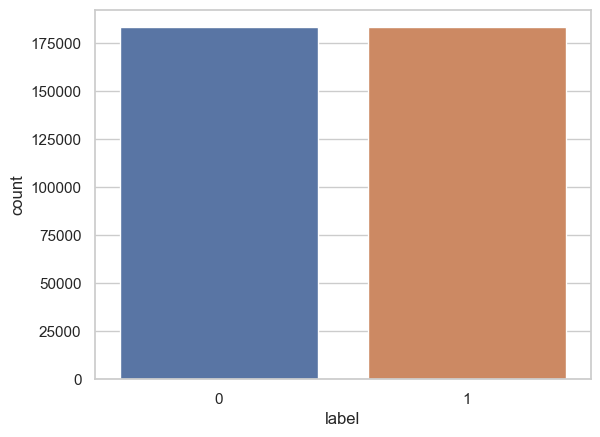

In [120]:
# Visualizing the data after oversampling

sns.countplot(y)
plt.show()

# Finding the best random state

In [121]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state =i)
    DTC = DecisionTreeClassifier()
    DTC.fit(x_train, y_train)
    pred = DTC.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.9166447087471266  on Random_state  194


# Train-Test Split

In [122]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30,random_state=maxRS)

# Feature Importance

In [123]:
# Lets check the feature importance using Random Forest Regressor

from sklearn.ensemble import RandomForestClassifier

RFC = RandomForestClassifier()
RFC.fit(x_train, y_train)
importances = pd.DataFrame({'Features':x.columns, 'Importance':np.round(RFC.feature_importances_,3)})
importances = importances.sort_values('Importance', ascending=False).set_index('Features')
importances

,Importance
Features,
cnt_ma_rech90,0.090
sumamnt_ma_rech90,0.080
Day,0.078
Month,0.070
daily_decr90,0.068
sumamnt_ma_rech30,0.065
daily_decr30,0.064
cnt_ma_rech30,0.050
last_rech_date_ma,0.037


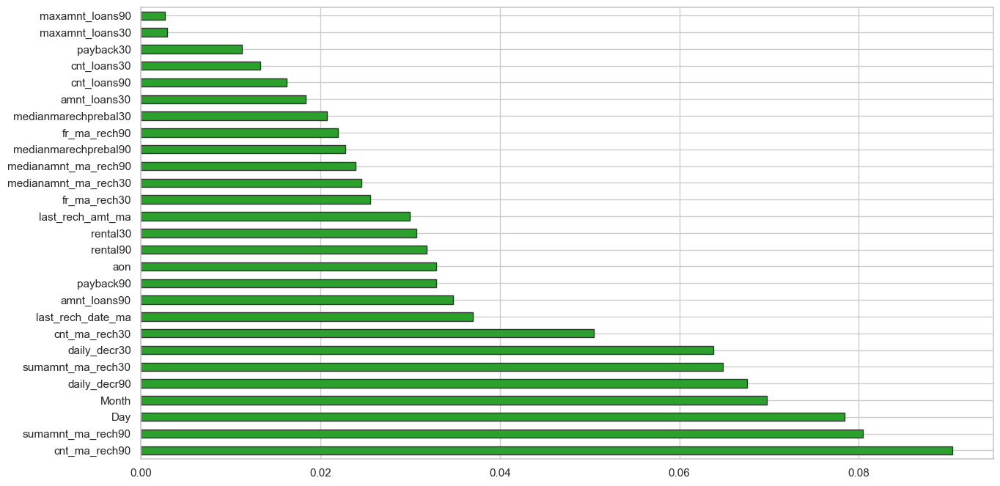

In [124]:
plt.figure(figsize=(15,8))
importances = pd.Series(RFC.feature_importances_, index=x.columns)
importances.nlargest(30).plot(kind='barh', color="tab:green", edgecolor=".2")
plt.show()

# Building Machine Learning Model

In [125]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier, BaggingClassifier
from xgboost import XGBClassifier as xgb

from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score, roc_auc_score
from sklearn.model_selection import cross_val_score

# i) Decision Tree Classifier

In [126]:
# Checking Accuracy and evaluation metrics for Decision Tree Classifier
DTC = DecisionTreeClassifier()

# Training the model
DTC.fit(x_train,y_train)

#Predicting y_test
predDTC = DTC.predict(x_test)

# Accuracy Score
DTC_score = accuracy_score(y_test, predDTC)*100
print("Accuracy Score:", DTC_score)

# ROC AUC Score
from sklearn.metrics import roc_auc_score
roc_auc_score = roc_auc_score(y_test,predDTC)*100      
print("\nroc_auc_score:", roc_auc_score)

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, predDTC)
print("\nConfusion Matrix:\n",conf_matrix)

# Classification Report
class_report = classification_report(y_test,predDTC)
print("\nClassification Report:\n", class_report)

# Cross Validation Score
cv_score = (cross_val_score(DTC, x, y, cv=5).mean())*100
print("Cross Validation Score:", cv_score)

# Result of accuracy minus cv scores
Result = DTC_score - cv_score
print("\nAccuracy Score - Cross Validation Score is", Result)

Accuracy Score: 91.64629880336909

roc_auc_score: 91.6451746922497

Confusion Matrix:
 [[50963  4140]
 [ 5054 49902]]

Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.92      0.92     55103
           1       0.92      0.91      0.92     54956

    accuracy                           0.92    110059
   macro avg       0.92      0.92      0.92    110059
weighted avg       0.92      0.92      0.92    110059

Cross Validation Score: 90.98518046179122

Accuracy Score - Cross Validation Score is 0.6611183415778754


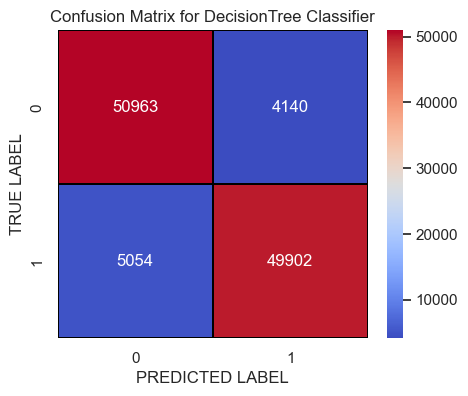

In [127]:
# Lets plot confusion matrix for DecisionTree Classifier

cm = confusion_matrix(y_test,predDTC)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(5,4))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black",fmt = ".0f", ax=ax, cmap="coolwarm",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for DecisionTree Classifier')
plt.show()

# ii) Random Forest Classifier

In [128]:
# Checking Accuracy and evaluation metrics for Random Forest Classifier
RFC = RandomForestClassifier()

# Training the model
RFC.fit(x_train,y_train)

#Predicting y_test
predRFC = RFC.predict(x_test)                       

# Accuracy Score 
RFC_score = accuracy_score(y_test, predRFC)*100     
print("Accuracy Score:", RFC_score)  

#ROC AUC Score
from sklearn.metrics import roc_auc_score           
roc_auc_score2 = roc_auc_score(y_test,predRFC)*100      
print("\nroc_auc_score:", roc_auc_score2)

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, predRFC)     
print("\nConfusion Matrix:\n",conf_matrix)

# Classification Report
class_report = classification_report(y_test,predRFC) 
print("\nClassification Report:\n", class_report)

# Cross Validation Score
cv_score2 = (cross_val_score(RFC, x, y, cv=5).mean())*100  
print("Cross Validation Score:", cv_score2)

# Result of accuracy minus cv scores
Result = RFC_score - cv_score2
print("\nAccuracy Score - Cross Validation Score is", Result)

Accuracy Score: 95.4197294178577

roc_auc_score: 95.41903800355658

Confusion Matrix:
 [[52864  2239]
 [ 2802 52154]]

Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.96      0.95     55103
           1       0.96      0.95      0.95     54956

    accuracy                           0.95    110059
   macro avg       0.95      0.95      0.95    110059
weighted avg       0.95      0.95      0.95    110059

Cross Validation Score: 95.04910656513876

Accuracy Score - Cross Validation Score is 0.37062285271893813


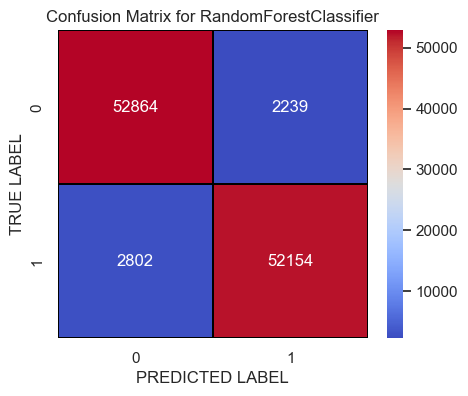

In [129]:
# Lets plot confusion matrix for RandomForestClassifier

cm = confusion_matrix(y_test,predRFC)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(5,4))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black",fmt = ".0f", ax=ax, cmap="coolwarm",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for RandomForestClassifier')
plt.show()

# iii) ExtraTrees Classifier

In [130]:
# Checking Accuracy and evaluation metrics for ExtraTrees Classifier
XT = ExtraTreesClassifier()

# Training the model
XT.fit(x_train,y_train) 

#Predicting y_test
predXT = XT.predict(x_test) 

# Accuracy Score 
XT_score = accuracy_score(y_test, predXT)*100     
print("Accuracy Score:", XT_score)  

# ROC AUC Score
roc_auc_score3 = roc_auc_score(y_test,predXT)*100      
print("\nroc_auc_score:", roc_auc_score3)

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, predXT)     
print("\nConfusion Matrix:\n",conf_matrix)

# Classification Report
class_report = classification_report(y_test,predXT) 
print("\nClassification Report:\n", class_report)

# Cross Validation Score
cv_score3 = (cross_val_score(XT, x, y, cv=5).mean())*100  
print("Cross Validation Score:", cv_score3)

# Result of accuracy minus cv scores
Result = XT_score - cv_score3
print("\nAccuracy Score - Cross Validation Score is", Result)

Accuracy Score: 96.11390254318138

roc_auc_score: 96.11201335415215

Confusion Matrix:
 [[53740  1363]
 [ 2914 52042]]

Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.98      0.96     55103
           1       0.97      0.95      0.96     54956

    accuracy                           0.96    110059
   macro avg       0.96      0.96      0.96    110059
weighted avg       0.96      0.96      0.96    110059

Cross Validation Score: 96.40246422644371

Accuracy Score - Cross Validation Score is -0.2885616832623299


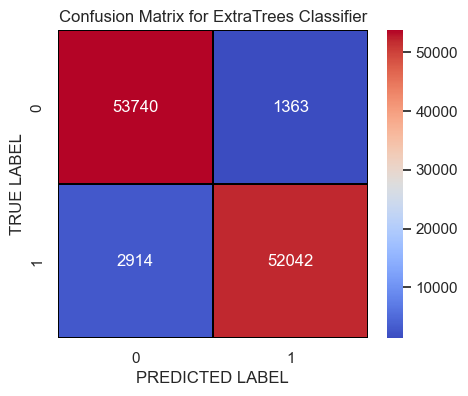

In [131]:
# Lets plot confusion matrix for ExtraTrees Classifier

cm = confusion_matrix(y_test,predXT)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(5,4))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black",fmt = ".0f", ax=ax, cmap="coolwarm",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for ExtraTrees Classifier')
plt.show()

# iv) GradientBoosting Classifier

In [132]:
# Checking Accuracy and evaluation metrics for GradientBoosting Classifier
GB = GradientBoostingClassifier()

# Training the model
GB.fit(x_train,y_train)   

#Predicting y_test
predGB = GB.predict(x_test)                       

# Accuracy Score 
GB_score = accuracy_score(y_test, predGB)*100     
print("Accuracy Score:", GB_score)  

# ROC AUC Score
roc_auc_score4 = roc_auc_score(y_test,predGB)*100      
print("\nroc_auc_score:", roc_auc_score4)

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, predGB)     
print("\nConfusion Matrix:\n",conf_matrix)

# Classification Report
class_report = classification_report(y_test,predGB) 
print("\nClassification Report:\n", class_report)

# Cross Validation Score
cv_score4 = (cross_val_score(GB, x, y, cv=5).mean())*100  
print("Cross Validation Score:", cv_score4)

# Result of accuracy minus cv scores
Result = GB_score - cv_score4
print("\nAccuracy Score - Cross Validation Score is", Result)

Accuracy Score: 90.39878610563426

roc_auc_score: 90.39688186678046

Confusion Matrix:
 [[50597  4506]
 [ 6061 48895]]

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.92      0.91     55103
           1       0.92      0.89      0.90     54956

    accuracy                           0.90    110059
   macro avg       0.90      0.90      0.90    110059
weighted avg       0.90      0.90      0.90    110059

Cross Validation Score: 89.79072190798

Accuracy Score - Cross Validation Score is 0.608064197654258


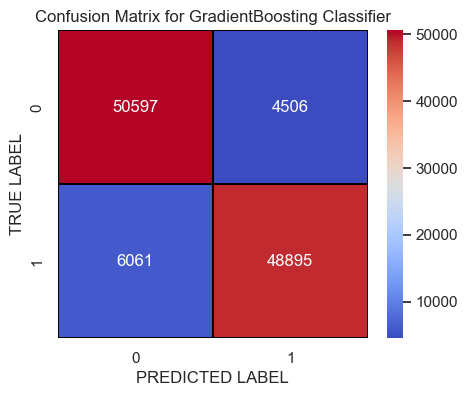

In [133]:
# Lets plot confusion matrix for GradientBoosting Classifier

cm = confusion_matrix(y_test,predGB)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(5,4))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black",fmt = ".0f", ax=ax, cmap="coolwarm",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for GradientBoosting Classifier')
plt.show()

# v) Extreme Gradient Boosting Classifier (XGB Classifier)

In [134]:
# Checking Accuracy and evaluation metrics for XGB Classifier
XGB = xgb(verbosity=0)

# Training the model
XGB.fit(x_train,y_train) 

#Predicting y_test
predXGB = XGB.predict(x_test)                       

# Accuracy Score
XGB_score = accuracy_score(y_test, predXGB)*100      
print("Accuracy Score:", XGB_score)  

# ROC AUC Score
roc_auc_score5 = roc_auc_score(y_test,predXGB)*100      
print("\nroc_auc_score:", roc_auc_score5)

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, predXGB)     
print("\nConfusion Matrix:\n",conf_matrix)

# Classification Report
class_report = classification_report(y_test,predXGB) 
print("\nClassification Report:\n", class_report)

# Cross Validation Score
cv_score5 = (cross_val_score(XGB, x, y, cv=5).mean())*100  
print("Cross Validation Score:", cv_score5)

# Result of accuracy minus cv scores
Result = XGB_score - cv_score5
print("\nAccuracy Score - Cross Validation Score is", Result)

Accuracy Score: 95.24891194722831

roc_auc_score: 95.2501036981717

Confusion Matrix:
 [[51994  3109]
 [ 2120 52836]]

Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.94      0.95     55103
           1       0.94      0.96      0.95     54956

    accuracy                           0.95    110059
   macro avg       0.95      0.95      0.95    110059
weighted avg       0.95      0.95      0.95    110059

Cross Validation Score: 93.6905740032923

Accuracy Score - Cross Validation Score is 1.55833794393601


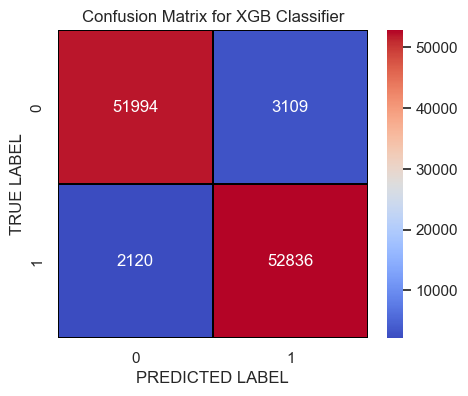

In [135]:
# Lets plot confusion matrix for XGB Classifier

cm = confusion_matrix(y_test,predXGB)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(5,4))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black",fmt = ".0f", ax=ax, cmap="coolwarm",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for XGB Classifier')
plt.show()

# vi) Bagging Classifier

In [136]:
# Checking Accuracy and evaluation metrics for Bagging Classifier
BC = BaggingClassifier()

# Training the model
BC.fit(x_train,y_train) 

#Predicting y_test
predBC = BC.predict(x_test)                       

# Accuracy Score 
BC_score = accuracy_score(y_test, predBC)*100     
print("Accuracy Score:", BC_score)  

# ROC AUC Score
roc_auc_score6 = roc_auc_score(y_test,predBC)*100      
print("\nroc_auc_score:", roc_auc_score6)

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, predBC)     
print("\nConfusion Matrix:\n",conf_matrix)

# Classification Report
class_report = classification_report(y_test,predBC) 
print("\nClassification Report:\n", class_report)

# Cross Validation Score
cv_score6 = (cross_val_score(BC, x, y, cv=5).mean())*100  
print("Cross Validation Score:", cv_score6)

# Result of accuracy minus cv scores
Result = BC_score - cv_score6
print("\nAccuracy Score - Cross Validation Score is", Result)

Accuracy Score: 94.25580824830318

roc_auc_score: 94.2540261799315

Confusion Matrix:
 [[52672  2431]
 [ 3891 51065]]

Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.96      0.94     55103
           1       0.95      0.93      0.94     54956

    accuracy                           0.94    110059
   macro avg       0.94      0.94      0.94    110059
weighted avg       0.94      0.94      0.94    110059

Cross Validation Score: 93.7608829788175

Accuracy Score - Cross Validation Score is 0.4949252694856767


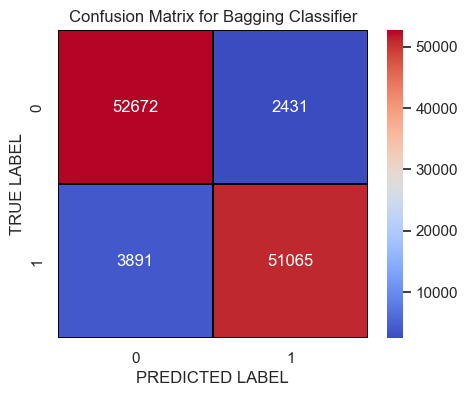

In [137]:
# Lets plot confusion matrix for Bagging Classifier

cm = confusion_matrix(y_test,predBC)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(5,4))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black",fmt = ".0f", ax=ax, cmap="coolwarm",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Bagging Classifier')
plt.show()

# Plotting ROC and Comparing AUC for all the models used

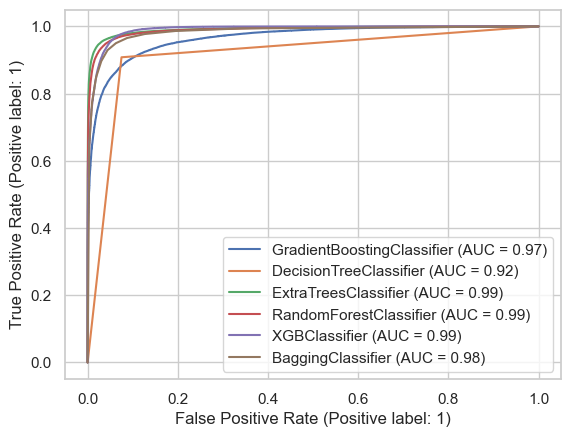

In [138]:
# Plotting for all the models used here

from sklearn import datasets 
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve 

disp = plot_roc_curve(GB,x_test,y_test)     # ax_=Axes with confusion matrix
plot_roc_curve(DTC, x_test, y_test, ax=disp.ax_)
plot_roc_curve(XT, x_test, y_test, ax=disp.ax_)
plot_roc_curve(RFC, x_test, y_test, ax=disp.ax_)
plot_roc_curve(XGB, x_test, y_test, ax=disp.ax_)
plot_roc_curve(BC, x_test, y_test, ax=disp.ax_)

plt.legend(prop={'size':11}, loc='lower right')
plt.show()

# Hyper Parameter Tuning

In [140]:
from sklearn.model_selection import RandomizedSearchCV

# GradientBoosting Classifier
parameters = {'max_depth': [3,6,9],  
              'max_features':['auto', 'sqrt', 'log2'],
              'learning_rate':[0.1,0.25,0.5],
              'min_samples_leaf': [1,50,100]}

In [141]:
RCV = RandomizedSearchCV(GradientBoostingClassifier(), parameters, cv=5, n_iter =10)

In [142]:
RCV.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=GradientBoostingClassifier(),
                   param_distributions={'learning_rate': [0.1, 0.25, 0.5],
                                        'max_depth': [3, 6, 9],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 50, 100]})

In [143]:
RCV.best_params_

{'min_samples_leaf': 100,
 'max_features': 'auto',
 'max_depth': 6,
 'learning_rate': 0.25}

In [145]:
# Creating the final model 

Micro_Credit_Model = GradientBoostingClassifier(min_samples_leaf = 100, max_features = "auto", max_depth = 6,learning_rate = 0.25)
Micro_Credit_Model.fit(x_train, y_train)
pred = Micro_Credit_Model.predict(x_test)
acc_score = accuracy_score(y_test,pred)
print("Accuracy score for the Best Model is:", acc_score*100)

Accuracy score for the Best Model is: 95.16713762618232


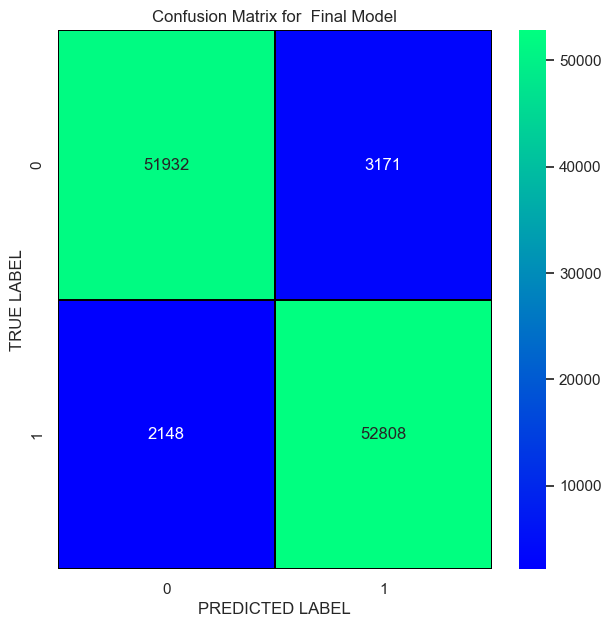

In [146]:
# Lets plot confusion matrix for the final model

cm = confusion_matrix(y_test,pred)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="winter",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for  Final Model')
plt.show()

# Plotting ROC and Comparing AUC for the Final model

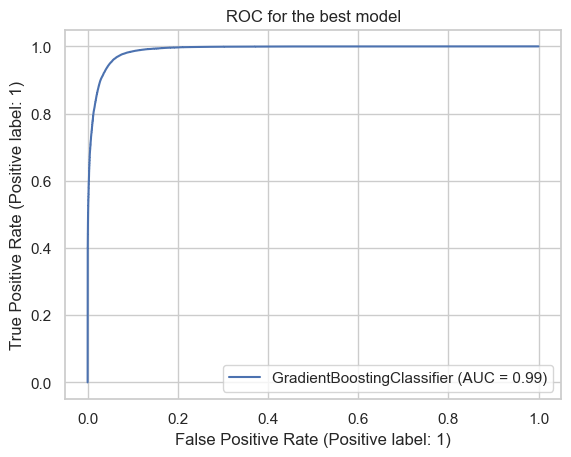

In [147]:
# Let's check the Auc for the best model after hyper parameter tuning

plot_roc_curve(Micro_Credit_Model, x_test, y_test)
plt.title("ROC for the best model")
plt.show()

# Saving The model

In [148]:
# Saving the model using .pkl

import joblib
joblib.dump(Micro_Credit_Model,"Micro_Credit_Loan_Defaulter.pkl")

['Micro_Credit_Loan_Defaulter.pkl']

# Loading and Predicting the saved model

In [149]:
# Loading the saved model
model=joblib.load("Micro_Credit_Loan_Defaulter.pkl")

#Prediction
prediction = model.predict(x_test)
prediction

array([0, 0, 1, ..., 0, 1, 1], dtype=int64)

In [150]:
# Creating dataframe for predicted results

pd.DataFrame([model.predict(x_test)[:],y_test[:]], index=["Predicted","Original"])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

# Concluding Remarks

<b>We predicted the outcomes in terms of a probability for each loan transaction, whether the customer will be paying back the loaned amount within 5 days of insurance of loan using different Classification Models.The best accuracy score of 95.09% was achieved using the best parameters of GradientBoosting Classifier through RandomizedSearchCV.</b>

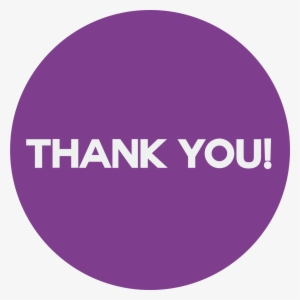